### <b>Install the required libraries</b>

In [1]:
#Install the transformers library (Allows importing models from Hugging Face)
!pip install transformers
!pip install datasets 

### <b>Import necessary libraries</b>

In [2]:
import copy 
import json
import logging 
import os 

import warnings
warnings.filterwarnings("ignore")
import logging
logging.basicConfig(level=logging.ERROR)

import numpy as np
import pandas as pd
from datasets import load_dataset
from sklearn.model_selection import train_test_split
from tqdm import tqdm
import torch

In [3]:
# Check if CUDA is available
print("CUDA Available:", torch.cuda.is_available())

# If CUDA is available, print the current GPU details
if torch.cuda.is_available():
    print("Current GPU Index:", torch.cuda.current_device())
    print("Current GPU Name:", torch.cuda.get_device_name(torch.cuda.current_device()))
    print("GPU Memory Allocated:", torch.cuda.memory_allocated())
    print("GPU Memory Cached:", torch.cuda.memory_cached())

CUDA Available: True
Current GPU Index: 0
Current GPU Name: GeForce RTX 2080 Ti
GPU Memory Allocated: 0
GPU Memory Cached: 0


### <b>Load the model from Hugging Face's model hub</b>

In [4]:
import transformers
from transformers import AutoConfig, AutoModel, AutoModelForSequenceClassification, AutoTokenizer
from transformers import AdamW, get_linear_schedule_with_warmup

In [5]:
MODEL_CLASSES = ["klue/roberta-base", "klue/roberta-small", "klue/roberta-large"]

In [6]:
from transformers import AutoModel, AutoTokenizer, BigBirdConfig

model_path = MODEL_CLASSES[0]
model = AutoModel.from_pretrained(model_path)
tokenizer = AutoTokenizer.from_pretrained(model_path)

text = "한국어 RoBERTa 모델을 공개합니다!"
encoded_input = tokenizer(text, return_tensors='pt', truncation=True)
output = model(**encoded_input)

Some weights of RobertaModel were not initialized from the model checkpoint at klue/roberta-base and are newly initialized: ['roberta.pooler.dense.weight', 'roberta.pooler.dense.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [7]:
# Print the values of the final hidden state
print(output[0])

# Print the shape of the final hidden state
print(output[0].shape)

tensor([[[ 0.1110, -0.5521, -0.1322,  ..., -0.1391, -0.0510, -0.0055],
         [ 0.1413,  0.4770,  0.5635,  ..., -0.7846,  0.2246, -0.3912],
         [ 0.2544,  0.5302,  1.2237,  ..., -0.9378,  0.0804, -0.7586],
         ...,
         [-0.6702,  0.3013,  0.2721,  ..., -0.3141,  0.2496, -0.5966],
         [-0.2941,  0.1332, -0.1701,  ..., -0.3679,  0.6020, -0.3439],
         [ 0.1102, -0.5519, -0.1323,  ..., -0.1397, -0.0506, -0.0053]]],
       grad_fn=<NativeLayerNormBackward0>)
torch.Size([1, 13, 768])


### <b>Set hyperparameters for the experiment</b>

In [8]:
from types import SimpleNamespace

# Create a configuration object to store hyperparameters and other settings
config = SimpleNamespace()

config.task = "roberta_multi"
config.dataset = "KoMultiText"

config.cache_dir = "roberta_multi_cache" # Temporary directory for current task assets like vocabulary
config.output_dir = "roberta_multi_output" # Directory where final models and results will be saved

config.use_tpu = False
config.model_name_or_path = model_path 
config.data_dir = "./" # The input data dir 

config.train_file = "train_dataset.csv" 
config.predict_file = "test_dataset.csv" 

config.max_seq_length = 512 # Maximum sequence length
config.train_batch_size = 8 # Batch size for training
config.eval_batch_size = 4 # Batch size for evaluation

config.learning_rate = 3e-6 # The initial learning rate for Adam
config.num_train_epochs = 20 # Total number of training epochs to perform

config.gradient_accumulation_steps = 4 # Number of updates steps to accumulate before performing a backward/update pass.
config.threads = 4
config.seed = 42 

config.device_num = 0 # Device number (changable for multi-GPU setups)

config.do_train = True 
config.do_eval_during_train = True
config.do_eval = True 

config.do_lower_case = False
config.weight_decay = 0.0 # Weight decay if we apply some.
config.adam_epsilon = 1e-8 # Epsilon for Adam optimizer.
config.max_grad_norm = 1.0 # Max gradient norm.
config.warmup_proportion = 0.0 # Warmup proportion for linear warmup

### <b>Preprocessing the training dataset</b>
* Instead of tokenizing the training text every time, we preprocess and <b>save all tokenized results before starting the model training</b>.
    * This approach significantly speeds up the process.

In [9]:
tokenizer = AutoTokenizer.from_pretrained(config.model_name_or_path, do_lower_case=False, cache_dir=config.cache_dir)

In [10]:
def train_split(config, texts, labels, is_train):
    
    x_train, y_train, x_label, y_label = train_test_split(
        texts, labels, test_size=0.2, random_state=config.seed, stratify=None
    )
    if is_train:
        texts, labels = x_train, x_label
    else:
        texts, labels = y_train, y_label
        
    return texts, labels

def process_comment_cls(config, data_file, is_train):
    
    df = pd.read_csv(data_file)
    df = df[df["preference"]!= -1] # Exclude rows where preference is -1
    
    # Convert columns to lists for processing
    preferences = df["preference"].astype(int).values.tolist()
    profanities = df["profanity"].astype(int).values.tolist()
    genders = df["gender"].astype(int).values.tolist()
    politics = df["politics"].astype(int).values.tolist()
    nations = df["nation"].astype(int).values.tolist()
    races = df["race"].astype(int).values.tolist()
    regions = df["region"].astype(int).values.tolist()
    generations= df["generation"].astype(int).values.tolist()
    social_clss = df["social hierarchy"].astype(int).values.tolist()
    appearances = df["appearance"].astype(int).values.tolist()
    others = df["others"].astype(int).values.tolist()
    
     # Create a combined label list
    labels = []
    for i in range(len(preferences)):
        preference = preferences[i] 
        profanity = profanities[i] 
        gender = genders[i] 
        politic = politics[i] 
        nation = nations[i]
        race = races[i]
        region = regions[i]
        generation = generations[i]
        social_cls = social_clss[i]
        appearance = appearances[i]
        other = others[i]
        labels.append([preference, profanity, gender, politic, nation, race, region, generation, social_cls, appearance, other])
        
    texts = df["comment"].astype(str).values.tolist()
    texts, labels = train_split(config, texts, labels, is_train) # Split the data
    
    return texts, labels

In [11]:
import torch.utils.data as torch_data

def data_pretokenizing(config, tokenizer, is_train=True):
    
    if is_train:
        data_file = config.train_file
    else:
        data_file = config.predict_file

    data_path = config.data_dir
    if data_file is not None:
        data_path = os.path.join(data_path, data_file)
    else:
        data_path += "/"

    # Construct the file name for the tokenized dataset
    comps = [
        data_path,
        config.dataset,
        config.model_name_or_path.replace("/", "_"),
        config.max_seq_length,
        "train" if is_train else "dev",
        "dataset.txt",
    ]
    dataset_file = "_".join([str(comp) for comp in comps])
    print("dataset_file:", dataset_file)

    # Tokenize the dataset and write to the file
    with open(dataset_file, "w", encoding="utf-8") as writer_file:
        cnt = 0
        total_data = process_comment_cls(config, data_path, is_train)
        for text, label in zip(total_data[0], total_data[1]):
            feature = tokenizer(text, max_length=config.max_seq_length, padding="max_length", truncation=True, add_special_tokens=True)
            writed_data = {
                "input_ids": feature["input_ids"],
                "attention_mask": feature["attention_mask"],
                "preference": int(label[0]), 
                "profanity": int(label[1]),
                "gender": int(label[2]),
                "politic": int(label[3]), 
                "nation" : int(label[4]),
                "race" : int(label[5]),
                "region" : int(label[6]),
                "generation" : int(label[7]),
                "social_cls" : int(label[8]),
                "appearance" : int(label[9]),
                "other": int(label[10]),
            }
            writer_file.write(json.dumps(writed_data) + "\n")
            cnt += 1
        print(f"{cnt} features processed from {data_path}")

    return dataset_file

In [12]:
if config.do_train:
    # Preprocess the training dataset
    train_dataset_file = data_pretokenizing(config, tokenizer=tokenizer)

# Preprocess the evaluation dataset (evaluation is equivalent to 'dev' or 'validation')
predict_dataset_file = data_pretokenizing(config, tokenizer=tokenizer, is_train=False)

dataset_file: ./train_dataset.csv_KoMultiText_klue_roberta-base_512_train_dataset.txt
30688 features processed from ./train_dataset.csv
dataset_file: ./test_dataset.csv_KoMultiText_klue_roberta-base_512_dev_dataset.txt
400 features processed from ./test_dataset.csv


### <b>Initialize the data loader</b>

In [13]:
class IterableDatasetPad(torch.utils.data.IterableDataset):
    def __init__(
        self,
        dataset: torch.utils.data.IterableDataset,
        batch_size: int = 1,
        num_devices: int = 1,
        seed: int = 0,
    ):
        self.dataset = dataset
        self.batch_size = batch_size
        self.seed = seed
        self.num_examples = 0

        chunk_size = self.batch_size * num_devices
        length = len(dataset)
        self.length = length + (chunk_size - length % chunk_size)

    def __len__(self):
        return self.length

    def __iter__(self):
        self.num_examples = 0
        # If dataset has a set epoch method, set the manual seed for reproducibility
        if (
            not hasattr(self.dataset, "set_epoch")
            and hasattr(self.dataset, "generator")
            and isinstance(self.dataset.generator, torch.Generator)
        ):
            self.dataset.generator.manual_seed(self.seed + self.epoch)

        first_batch = None
        current_batch = []
        for element in self.dataset:
            self.num_examples += 1
            current_batch.append(element)
            # Yield the current batch once it's full
            if len(current_batch) == self.batch_size:
                for batch in current_batch:
                    yield batch
                    if first_batch is None:
                        first_batch = batch.copy()
                current_batch = []
                
        # Pad the last batch if it's smaller than the batch size
        while self.num_examples < self.length:
            add_num = self.batch_size - len(current_batch)
            self.num_examples += add_num
            current_batch += [first_batch] * add_num
            for batch in current_batch:
                yield batch
            current_batch = []

In [14]:
def collate_fn(features):
    
    # Extracting individual features from samples
    input_ids = [sample["input_ids"] for sample in features]
    attention_mask = [sample["attention_mask"] for sample in features]
    
    preference = [sample["preference"] for sample in features]
    profanity = [sample["profanity"] for sample in features]
    gender = [sample["gender"] for sample in features]
    politic = [sample["politic"] for sample in features]
    nation = [sample["nation"] for sample in features]
    race = [sample["race"] for sample in features]
    region = [sample["region"] for sample in features]
    generation = [sample["generation"] for sample in features]
    social_cls = [sample["social_cls"] for sample in features]
    appearance = [sample["appearance"] for sample in features]
    other = [sample["other"] for sample in features]
    
    # Convert lists to tensors
    input_ids = torch.tensor(np.array(input_ids).astype(np.int64), dtype=torch.long)
    attention_mask = torch.tensor(np.array(attention_mask).astype(np.int8), dtype=torch.long)
    
    preference = torch.tensor(np.array(preference).astype(np.int64), dtype=torch.long)
    profanity = torch.tensor(np.array(profanity).astype(np.int64), dtype=torch.float)
    gender = torch.tensor(np.array(gender).astype(np.int64), dtype=torch.float)
    politic = torch.tensor(np.array(politic).astype(np.int64), dtype=torch.float)
    nation = torch.tensor(np.array(nation).astype(np.int64), dtype=torch.float)
    race = torch.tensor(np.array(race).astype(np.int64), dtype=torch.float)
    region = torch.tensor(np.array(region).astype(np.int64), dtype=torch.float)
    generation = torch.tensor(np.array(generation).astype(np.int64), dtype=torch.float)
    social_cls = torch.tensor(np.array(social_cls).astype(np.int64), dtype=torch.float)
    appearance = torch.tensor(np.array(appearance).astype(np.int64), dtype=torch.float)
    other = torch.tensor(np.array(other).astype(np.int64), dtype=torch.float)
    
    inputs = {
        "input_ids": input_ids,
        "attention_mask": attention_mask,
    }
    labels = {
        "preference": preference,
        "profanity": profanity,
        "gender" : gender,
        "politic": politic,
        "nation" :nation, 
        "race" : race,
        "region" : region,
        "generation" : generation,
        "social_cls" : social_cls,
        "appearance" : appearance,
        "other" : other,
    }
    
    return inputs, labels

In [15]:
# If in training mode, prepare training data
if config.do_train:
    
    # Load dataset from file and parse JSON entries
    train_dataset = load_dataset("text", data_files=train_dataset_file, download_mode="force_redownload")["train"]
    train_dataset = train_dataset.map(lambda x: json.loads(x["text"]), batched=False)
    
    # Create data loader for training
    train_dataloader = torch_data.DataLoader(
        train_dataset,
        sampler=torch_data.RandomSampler(train_dataset),
        drop_last=False,
        batch_size=config.train_batch_size,
        collate_fn=(collate_fn),
    )

# Prepare the evaluation (prediction) data
predict_dataset = load_dataset("text", data_files=predict_dataset_file, download_mode="force_redownload")["train"]
predict_dataset = predict_dataset.map(lambda x: json.loads(x["text"]), batched=False)

# Pad the dataset to make it evenly divisible by the batch size
predict_dataset = IterableDatasetPad(
    dataset=predict_dataset,
    batch_size=config.eval_batch_size,
    num_devices=1,
    seed=config.seed,
)

# Create data loader for prediction
predict_dataloader = torch_data.DataLoader(
    predict_dataset,
    sampler=None,
    drop_last=False,
    batch_size=config.eval_batch_size,
    collate_fn=(collate_fn),
)

Extracting data files:   0%|          | 0/1 [00:00<?, ?it/s]

Generating train split: 0 examples [00:00, ? examples/s]

Dataset text downloaded and prepared to /home/dasol/.cache/huggingface/datasets/text/default-65281fb2fe0ed235/0.0.0/cb1e9bd71a82ad27976be3b12b407850fe2837d80c22c5e03a28949843a8ace2. Subsequent calls will reuse this data.


  0%|          | 0/1 [00:00<?, ?it/s]

Map:   0%|          | 0/30688 [00:00<?, ? examples/s]

Extracting data files:   0%|          | 0/1 [00:00<?, ?it/s]

Generating train split: 0 examples [00:00, ? examples/s]

Dataset text downloaded and prepared to /home/dasol/.cache/huggingface/datasets/text/default-4ae00bfe6dbd6daa/0.0.0/cb1e9bd71a82ad27976be3b12b407850fe2837d80c22c5e03a28949843a8ace2. Subsequent calls will reuse this data.


  0%|          | 0/1 [00:00<?, ?it/s]

Map:   0%|          | 0/400 [00:00<?, ? examples/s]

### <b>Define the text classification model</b>

In [16]:
from transformers import AutoModel
import torch.nn as nn

class ClsModel(torch.nn.Module):
    def __init__(self):
        super().__init__()
        data_file = os.path.join(config.data_dir, str(config.train_file)) 
        model_config = AutoConfig.from_pretrained(config.model_name_or_path, num_labels=5)
        self.model = AutoModel.from_pretrained(
            config.model_name_or_path, config=model_config, cache_dir=config.cache_dir
        )

        # Initialize multiple classifiers (linear layers) for different tasks
        self.classifiers = nn.ModuleList([nn.Linear(768, size) for size in [5, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]])

        self.tokenizer = tokenizer

    def save_pretrained(self, save_dir):
        self.model.save_pretrained(save_dir)
        # Remove unnecessary keys from the tokenizer's init_kwargs
        for key in ["special_tokens_map_file", "tokenizer_file"]:
            self.tokenizer.init_kwargs.pop(key, None)
        self.tokenizer.save_pretrained(save_dir)

    def get_optimizer(self): 
        # Specify parameters that should not undergo weight decay during training
        no_decay = ["bias", "LayerNorm.weight"]
        # Group model parameters based on whether they should have weight decay or not
        optimizer_grouped_parameters = [
            {
                "params": [p for n, p in self.model.named_parameters() if not any(nd in n for nd in no_decay)],
                "weight_decay": config.weight_decay,
            },
            {
                "params": [p for n, p in self.model.named_parameters() if any(nd in n for nd in no_decay)],
                "weight_decay": config.weight_decay,
            },
        ]
        
        optimizer = AdamW(optimizer_grouped_parameters, lr=config.learning_rate, eps=config.adam_epsilon)
        return optimizer

    def get_scheduler(self, batch_num, optimizer): 
        # If no warmup is needed, return None
        if config.warmup_proportion == 0.0:
            return None
        
        # Calculate the total number of training steps
        t_total = batch_num // config.gradient_accumulation_steps * config.num_train_epochs
        
        # Define the learning rate scheduler with a linear warmup phase
        scheduler = get_linear_schedule_with_warmup(
            optimizer,
            num_warmup_steps=int(t_total * config.warmup_proportion),
            num_training_steps=t_total,
        )

        return scheduler

    def forward(self, inputs):
        
        hidden = self.model(**inputs) # Get the model's hidden states
        # Extract [CLS] token from the last layer
        cls_token_embeddings = hidden.last_hidden_state[:,0,:]  # [batch_size, 768]
        
        # Get outputs for each task using the respective classifier
        outputs = [classifier(cls_token_embeddings) for classifier in self.classifiers]
        
        return outputs
    
    def eval_step(self, inputs, labels, outputs):
        
        label_keys = ["preference", "profanity", "gender", "politic", "nation", "race", "region", "generation", "social_cls", "appearance", "other"]
        results = {}
        
        # Process the first output (softmax for multiple classes)
        logits_1 = outputs[0].detach().cpu()
        probabilities = torch.nn.functional.softmax(logits_1, dim=1)
        results["results_1"] = [{"prediction": pred, "label": label, "prob": prob} for pred, label, prob in zip(self.tensor_to_list(torch.argmax(logits_1, dim=-1)), self.tensor_to_list(labels["preference"]), probabilities)]
        
        # Process the other outputs (sigmoid for binary classification)
        for idx, key in enumerate(label_keys[1:], 2):
            logits = outputs[idx-1].detach().cpu()
            threshold = 0.5
            predictions = self.tensor_to_list((torch.sigmoid(logits) > threshold).int())
            results[f"results_{idx}"] = [{"prediction": prediction, "label": label, "prob": torch.sigmoid(prob).item()} for prediction, label, prob in zip(predictions, self.tensor_to_list(labels[key]), logits)]
        
        return results

    def tensor_to_array(self, tensor):
        return tensor.detach().cpu().numpy()
    
    def tensor_to_list(self, tensor):
        return self.tensor_to_array(tensor).tolist()

In [17]:
# Set the random seed for reproducibility in both numpy and PyTorch
def set_seed(seed):
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = True

# Calculate the running average of the loss using a decay factor
def cal_running_avg_loss(loss, running_avg_loss, decay=0.99):
    if running_avg_loss == 0:
        return loss
    running_avg_loss = running_avg_loss * decay + (1 - decay) * loss
    return running_avg_loss

### <b>Define the functions for training and evaluation</b>

In [18]:
from functools import partial
import sklearn.metrics as sklearn_metrics
from sklearn.metrics import mean_absolute_error, f1_score, precision_recall_curve, auc, roc_curve
import matplotlib.pyplot as plt

category_map = {
    1: "preference",
    2: "profanity",
    3: "gender",
    4: "politics",
    5: "nation",
    6: "race",
    7: "region",
    8: "generation",
    9: "social hierarchy",
    10: "appearance",
    11: "others"
}

# Metrics for binary-classification
binary_metrics = {
    "accuracy": sklearn_metrics.accuracy_score,
    "precision": sklearn_metrics.precision_score,
    "recall": sklearn_metrics.recall_score,
    "f1": sklearn_metrics.f1_score,
    "matthews_corrcoef": sklearn_metrics.matthews_corrcoef,
}

# Metrics for multi-classification
metrics = {
    "accuracy": sklearn_metrics.accuracy_score,
    "f1-macro": partial(sklearn_metrics.f1_score, average="macro"),
}   

# Function to compute top 2 accuracy. 
# This considers a prediction as correct if the true label is among the top 2 predicted labels.
def top2_accuracy(labels, prob):
    if isinstance(prob, torch.Tensor):
        prob_concatenated = prob
    else:
        prob_concatenated = torch.cat(prob, dim=0)

    top_2_indices = torch.topk(prob_concatenated, 2, dim=1)[1]
    match = (top_2_indices == torch.tensor(labels).view(-1, 1)).any(dim=1)
    return match.float().mean().item()

# Function to compute top 2 F1 score in a macro-average setting. 
# This treats each class independently then averages the F1 scores.
def top2_f1_macro(labels, prob):
    if isinstance(prob, torch.Tensor):
        prob_concatenated = prob
    else:
        prob_concatenated = torch.cat(prob, dim=0)
    top_2_indices = torch.topk(prob_concatenated, 2, dim=1)[1]
    labels = np.array(labels)
    
    top_2_pred = np.zeros((len(labels), prob_concatenated.shape[1]), dtype=int)
    for i, indices in enumerate(top_2_indices):
        top_2_pred[i, indices] = 1

    y_true = np.zeros((len(labels), prob_concatenated.shape[1]), dtype=int)
    y_true[np.arange(len(labels)), labels] = 1
    
    return f1_score(y_true, top_2_pred, average='macro')

# Function to calculate the area under the Precision-Recall curve.
def calculate_pr_auc(labels, prob):
    precision, recall, _ = precision_recall_curve(labels, prob)
    return auc(recall, precision)

# General function to plot either the ROC or Precision-Recall curve for multiple categories.
def plot_curve(labels_list, probs_list, category_names, epoch, curve_type="auroc", dpi=200):
    plt.figure(figsize=(10, 6), dpi=dpi)
    for labels, probs, category_name in zip(labels_list, probs_list, category_names):
        if curve_type == "auroc":
            save_path = f"bias_auroc_{epoch}.png" 
            x, y, _ = roc_curve(labels, probs)
            metric = auc(x, y)
            xlabel, ylabel, title = 'False Positive Rate', 'True Positive Rate', 'ROC Curves for Bias Labels'
        else:
            save_path = f"bias_prroc_{epoch}.png"
            x, y, _ = precision_recall_curve(labels, probs)
            metric = auc(y, x)
            xlabel, ylabel, title = 'Recall', 'Precision', 'Precision-Recall Curves for Bias Labels'
        
        plt.plot(x, y, lw=2, label=f'{category_name} (AUC = {metric:.2f})')

    if curve_type == "auroc":
        plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel(xlabel, fontsize=16)
    plt.ylabel(ylabel, fontsize=16)
    plt.title(title, fontsize=19)
    plt.legend(loc='lower right' if curve_type == "auroc" else 'lower left', fontsize=14)
    plt.tight_layout()
    plt.savefig(save_path, format='png', dpi=dpi)
    plt.show()

# Function dedicated to plot the ROC curve for the profanity category.
def plot_single_roc_curve(labels, probs, category_name, epoch, dpi=200):
    plt.figure(figsize=(10, 6), dpi=dpi)
    x, y, _ = roc_curve(labels, probs)
    metric = auc(x, y)
    
    plt.plot(x, y, lw=2, label=f'{category_name} (AUC = {metric:.2f})')
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate', fontsize=16)
    plt.ylabel('True Positive Rate', fontsize=16)
    plt.title('ROC Curve for Profanity Classification', fontsize=19)
    plt.legend(loc='lower right', fontsize=16)
    plt.tight_layout()
    plt.savefig(f"profanity_auroc_{epoch}.png", format='png', dpi=dpi)
    plt.show()

# Evaluate the performance of the model based on various metrics     
def eval_cls(all_results, all_probs, epoch, **kwargs):
    
    results_dict = {}
    labels_list = []
    probs_list = []
    category_names = []

    for i in range(11):
        results_i = all_results[i]
        probs_i = all_probs[i]
        
        # Extract predictions and ground truth labels for the current category.
        predictions = np.array([result["prediction"] for result in results_i])
        labels = np.array([result["label"] for result in results_i])
        
        # Use binary metrics for binary classification tasks and multi-class metrics for multi-class tasks.
        metric_funcs = binary_metrics if i > 0 else metrics
        # Compute and store each metric.
        results = {metric: round(f(labels, predictions) * 100, 2) for metric, f in metric_funcs.items()}
        
        # If it's a binary task, compute PR and ROC AUC metrics.
        if i > 0:
            y_scores = np.array([prob[1] if prob.size(0) > 1 else prob[0] for prob in probs_i])
            results["pr_auc"] = calculate_pr_auc(labels, y_scores)
            results["roc_auc"] = sklearn_metrics.roc_auc_score(labels, y_scores)
            results_dict[f"pr_auc_{i+1}"] = results["pr_auc"]
            results_dict[f"roc_auc{i+1}"] = results["roc_auc"]
        
        # If the task is one of the bias categories, add labels and probabilities to the lists for plotting.
        if i > 1:
            labels_list.append(labels)
            probs = np.array([prob[1] if prob.size(0) > 1 else prob[0] for prob in probs_i])
            probs_list.append(probs)
            category_name = category_map.get(i+1, f"Category {i+1}")
            category_names.append(category_name)
        
         # Special computations for the Preference category.
        if i == 0:  # Preference category
            results_dict["pref_mae"] = mean_absolute_error(labels, predictions)
            results_dict["pref_top2_acc"] = top2_accuracy(labels, probs_i)
            results_dict["pref_top2_f1"] = top2_f1_macro(labels, probs_i)
        
        # If it's the Profanity category, plot the ROC curve.
        if i == 1:
            y_scores = np.array([prob[1] if prob.size(0) > 1 else prob[0] for prob in probs_i])
            plot_single_roc_curve(labels, y_scores, category_map[i+1], epoch)

        results_dict[f"results_{i+1}"] = results
        
            
    # Plot the ROC and PRROC curves for all bias tasks (categories from 2 to 11).
    if len(labels_list) > 0:
        plot_curve(labels_list, probs_list, category_names, epoch)
        plot_curve(labels_list, probs_list, category_names,  epoch, curve_type="prroc")

    return results_dict

In [19]:
import torch
import torch.nn as nn
from tqdm import tqdm

def _run_epoch(model, loader, device=None, context=None, **kwargs):
    config = kwargs["config"]
    is_train = kwargs["is_train"]

    avg_loss = 0
    results = []
    batch_num = len(loader)
    
    total_class_counts = [0] * 5 
    correct_class_counts = [0] * 5
    
    # Initialize optimizer and scheduler if in training mode
    optimizer, scheduler = None, None
    if is_train:
        model.train()
        if config.use_tpu:
            optimizer = context.getattr_or("optimizer", lambda: model.get_optimizer())
            scheduler = context.getattr_or("scheduler", lambda: model.get_scheduler(batch_num, optimizer))
        else:
            optimizer = kwargs["optimizer"]
            scheduler = kwargs["scheduler"]
    else:
        model.eval()
    
    # ProgressBar setup
    is_master = True
    pbar = tqdm(enumerate(loader), total=batch_num, disable=not is_master, dynamic_ncols=True, position=0, leave=True)

    corrections = [0] * 11
    total = 0
    
    # Weighting for the class imbalance
    weights = torch.tensor([max([11, 31, 50, 6, 2]) / p for p in [11, 31, 50, 6, 2]]).float().to(device)
    label_keys = ["preference", "profanity", "gender", "politic", "nation", "race", "region", "generation", "social_cls", "appearance", "other"]
    weights_bias = [1, 10.0, 20.0]
    weights_final = [1, 1, 1.2, 1.2, 1.2, 1.2, 1.2, 1.2, 1.2, 1.2, 1.2]

    for i, (inputs, labels) in pbar:
        # Move tensors to device
        inputs = {k: v.to(device) if isinstance(v, torch.Tensor) else v for k, v in inputs.items()}
        labels = {k: v.to(device) if isinstance(v, torch.Tensor) else v for k, v in labels.items()}

        outputs = model(inputs)

        # First loss: preference 
        loss_function_1 = nn.CrossEntropyLoss(weight=weights)
        loss_1 = loss_function_1(outputs[0], labels["preference"])
        predicted1 = torch.argmax(outputs[0], dim=1)
        corrections[0] += predicted1.eq(labels["preference"]).sum().item()
        for j in range(5):  
            mask = (labels["preference"] == j)
            correct_class_counts[j] += predicted1[mask].eq(labels["preference"][mask]).sum().item()
            total_class_counts[j] += mask.sum().item()

        # Subsequent losses
        total_losses = [loss_1]
        threshold, threshold2 = 0.5, 0.40
        for idx, key in enumerate(label_keys[1:], 2):
            if key == "profanity":
                loss_fn = nn.BCEWithLogitsLoss()
            else:
                weight_value = weights_bias[1 if key == "gender" else 2]
                loss_fn = nn.BCEWithLogitsLoss(pos_weight=torch.tensor([weight_value]).to(device))
            
            loss = loss_fn(outputs[idx-1].squeeze(1), labels[key])
            total_losses.append(loss)
            predicted = torch.sigmoid(outputs[idx-1].squeeze(1)) >= (threshold if key == "profanity" else threshold2)
            corrections[idx-1] += predicted.eq(labels[key]).sum().item()

        # Compute the total loss using the individual weights
        total_loss = sum(w * l for w, l in zip(weights_final, total_losses))
        avg_loss = cal_running_avg_loss(total_loss.item(), avg_loss)
        total_loss /= config.gradient_accumulation_steps

        if is_train:
            total_loss.backward()
            if i % config.gradient_accumulation_steps == 0 or i == batch_num - 1:
                if config.max_grad_norm > 0:
                    torch.nn.utils.clip_grad_norm_(model.parameters(), config.max_grad_norm)
                optimizer.step()
                optimizer.zero_grad()
                if scheduler is not None:
                    scheduler.step()
        else:
            result = (model.module if hasattr(model, "module") else model).eval_step(inputs, labels, outputs)
            results.append(result)
        
        # Update progress bar
        if is_master:
            pbar.set_description(f"epoch: {kwargs['epoch'] + 1}, {('train' if is_train else 'valid')} loss: {min(100, round(avg_loss, 4))}")
            
    class_accuracies = [correct / total if total != 0 else 0 for correct, total in zip(correct_class_counts, total_class_counts)]
    
    print("Preference Accuracy per class")
    for i, acc in enumerate(class_accuracies):
        print(f"Class {i+1}: {acc*100:.2f}%")
        
    return {"loss": avg_loss, "result": results}

# Wrapper to run the epoch either on CPU/GPU or TPUs
def run_epoch(**kwargs):
    model = kwargs.pop("model")
    if kwargs["config"].use_tpu:
        results = model(_run_epoch, **kwargs)
    else:
        results = _run_epoch(model, **kwargs)

    if isinstance(results, list):
        loss = sum([result["loss"] for result in results]) / len(results)
        result = [res["result"] for res in results]
        results = {"loss": loss, "result": result}

    return results

### <b>Model Initialization and Configuration</b>

In [20]:
import os
import torch

set_seed(config.seed) # Set the random seed for reproducibility

model = ClsModel() # Initialize the classification model
print(f"Configuration: {str(config)}")

# Check for available GPUs and set the model to run on GPU(s) if available
if torch.cuda.is_available():
    gpu_count = torch.cuda.device_count()
    print(f"{gpu_count} GPU device(s) detected")
    device_num = config.device_num
    devices = [device_num]
    # Use Data Parallelism if more than one GPU is available
    model_dp = torch.nn.DataParallel(model, device_ids=devices)
    model_dp.to(devices[0])  
else:
    devices = ["cpu"] # If no GPUs are available, use the CPU
    model_dp = model

# Create cache directory if it doesn't exist
if not os.path.exists(config.cache_dir):
    os.makedirs(config.cache_dir)

# Define and create the output directory
output_dir = os.path.join(config.output_dir, config.task, config.dataset)
print("Output directory:", output_dir)
if not os.path.exists(output_dir):
    os.makedirs(output_dir)

# Initialize optimizer and scheduler if in training mode
optimizer = None
scheduler = None
if config.do_train:
    optimizer = model.get_optimizer()
    scheduler = model.get_scheduler(len(train_dataloader), optimizer)

# Bundle parameters for easy reference
params = {
    "config": config,
    "model": model_dp,
    "optimizer": optimizer,
    "scheduler": scheduler,
}
if not config.use_tpu:
    params["device"] = devices[0]

Some weights of RobertaModel were not initialized from the model checkpoint at klue/roberta-base and are newly initialized: ['roberta.pooler.dense.weight', 'roberta.pooler.dense.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Configuration: namespace(task='roberta_multi', dataset='KoMultiText', cache_dir='roberta_multi_cache', output_dir='roberta_multi_output', use_tpu=False, model_name_or_path='klue/roberta-base', data_dir='./', train_file='train_dataset.csv', predict_file='test_dataset.csv', max_seq_length=512, train_batch_size=8, eval_batch_size=4, learning_rate=3e-06, num_train_epochs=20, gradient_accumulation_steps=4, threads=4, seed=42, device_num=2, do_train=True, do_eval_during_train=True, do_eval=True, do_lower_case=False, weight_decay=0.0, adam_epsilon=1e-08, max_grad_norm=1.0, warmup_proportion=0.0)
4 GPU device(s) detected
Output directory: roberta_multi_output/roberta_multi/KoMultiText


### <b>Traning the model</b>

In [21]:
import os
import json
import copy
import torch

def do_eval(epoch):
    # No gradient computation during evaluation
    with torch.no_grad():
        # Run one epoch without training (inference only)
        results = run_epoch(loader=predict_dataloader, epoch=epoch, is_train=False, **params)["result"]
        
        # Group results by category
        all_results = [ [result_dict[f'results_{i}'] for result_dict in results] for i in range(1, 12) ]
        all_results = [ [item for sublist in result_list for item in sublist] for result_list in all_results ]
        
        # Extract probabilities from results
        probs = [ [result['prob'] for result in results] for results in all_results ]
        all_probs = []
        for p in probs:
            tensors = []
            for t in p:
                if isinstance(t, torch.Tensor):
                    tensors.append(t.view(1, -1))
                else:
                    tensors.append(torch.tensor([[t]]))
            all_probs.append(torch.cat(tensors))
        
        # Evaluate the model using the evaluation data
        eval_results = eval_cls(
            config=config,
            model=model,
            loader=predict_dataloader,
            tokenizer=model.tokenizer,
            all_results=all_results,
            all_probs=all_probs,
            epoch=epoch
        )
        
        category_labels = {
            1: "Preference",
            2: "Slang",
            3: "Gender",
            4: "Politic",
            5: "Nation",
            6: "Race",
            7: "Region",
            8: "Generation",
            9: "Social Class",
            10: "Appearance",
            11: "Other",
        }
        
        # Print evaluation results by category
        for i in range(1, 12):
            label_name = category_labels.get(i, f"Category {i}")
            print(f"\nEval results for {label_name}.")
            for k, v in eval_results[f"results_{i}"].items():
                print(f"{k} : {v}")
            if i == 1:
                print(f"preference_mae:{eval_results['pref_mae']}")
                print(f"preference_top2_accuracy:{eval_results['pref_top2_acc']}")
                print(f"preference_top2_f1:{eval_results['pref_top2_f1']}")
            
    return [eval_results[f"results_{i}"] for i in range(1, 12)] + [eval_results["pref_mae"], eval_results["pref_top2_acc"], eval_results["pref_top2_f1"]] + [eval_results[f"pr_auc_{i+1}"] for i in range(1, 11)]

epoch: 1, train loss: 10.024: 100%|██████████████████████████████████████| 3836/3836 [20:54<00:00,  3.06it/s]


Preference Accuracy per class
Class 1: 44.62%
Class 2: 30.15%
Class 3: 71.85%
Class 4: 13.31%
Class 5: 4.91%


epoch: 1, valid loss: 12.8765: 100%|███████████████████████████████████████| 101/101 [00:06<00:00, 15.48it/s]


Preference Accuracy per class
Class 1: 81.71%
Class 2: 33.33%
Class 3: 57.43%
Class 4: 17.39%
Class 5: 6.76%


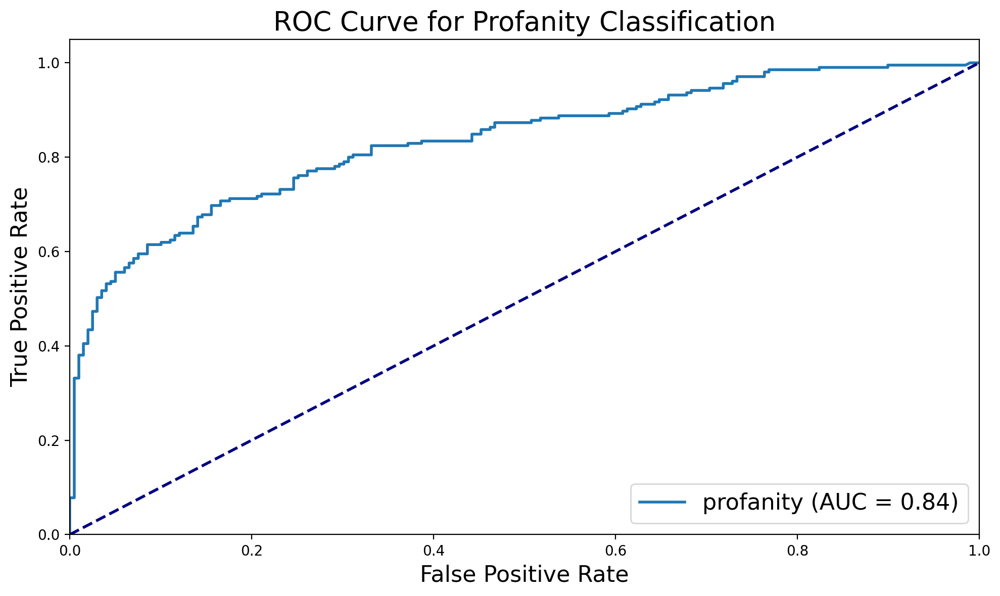

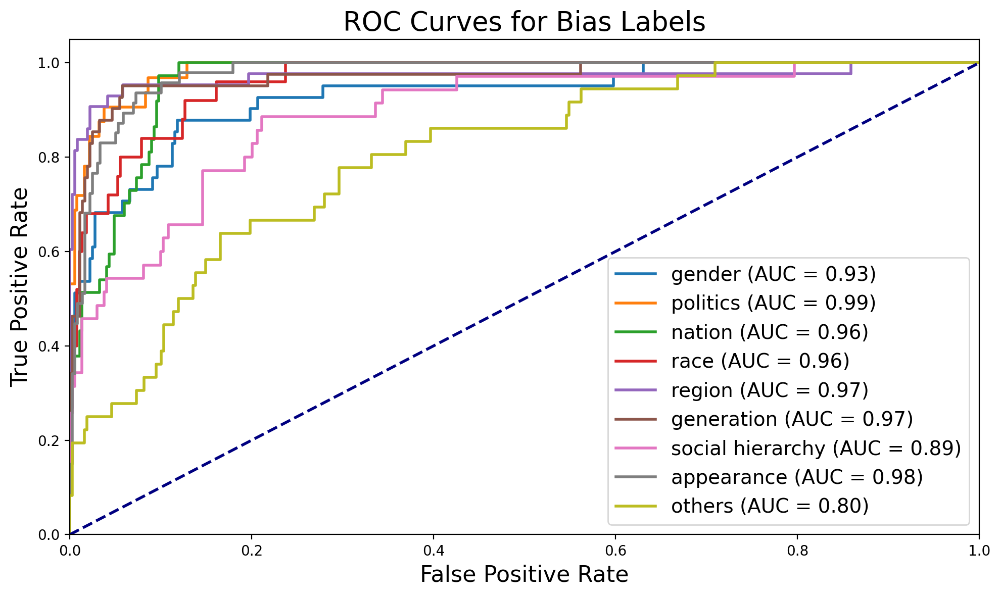

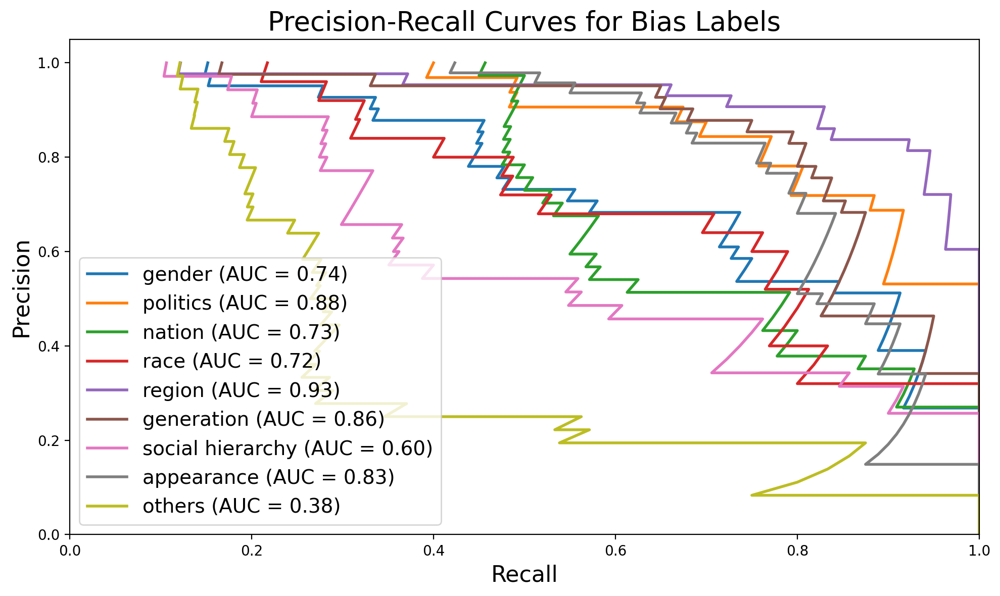


Eval results for Preference.
accuracy : 41.58
f1-macro : 35.72
preference_mae:0.7995049504950495
preference_top2_accuracy:0.75
preference_top2_f1:0.5044884844399505

Eval results for Slang.
accuracy : 76.98
precision : 81.46
recall : 70.73
f1 : 75.72
matthews_corrcoef : 54.53
pr_auc : 0.861676407409778
roc_auc : 0.8354577766883197

Eval results for Gender.
accuracy : 75.99
precision : 28.79
recall : 92.68
f1 : 43.93
matthews_corrcoef : 43.0
pr_auc : 0.744447866824887
roc_auc : 0.9295840892293221

Eval results for Politic.
accuracy : 88.12
precision : 39.74
recall : 96.88
f1 : 56.36
matthews_corrcoef : 57.64
pr_auc : 0.8838226833007489
roc_auc : 0.9850470430107527

Eval results for Nation.
accuracy : 90.59
precision : 49.32
recall : 97.3
f1 : 65.45
matthews_corrcoef : 65.38
pr_auc : 0.7275604367573538
roc_auc : 0.9622947197879078

Eval results for Race.
accuracy : 85.89
precision : 29.49
recall : 92.0
f1 : 44.66
matthews_corrcoef : 47.3
pr_auc : 0.7215690366724712
roc_auc : 0.961372031

epoch: 2, train loss: 8.3133: 100%|██████████████████████████████████████| 3836/3836 [22:19<00:00,  2.86it/s]


Preference Accuracy per class
Class 1: 67.62%
Class 2: 34.63%
Class 3: 71.81%
Class 4: 23.44%
Class 5: 17.64%


epoch: 2, valid loss: 10.6468: 100%|███████████████████████████████████████| 101/101 [00:06<00:00, 15.12it/s]


Preference Accuracy per class
Class 1: 87.80%
Class 2: 55.13%
Class 3: 57.43%
Class 4: 34.78%
Class 5: 12.16%


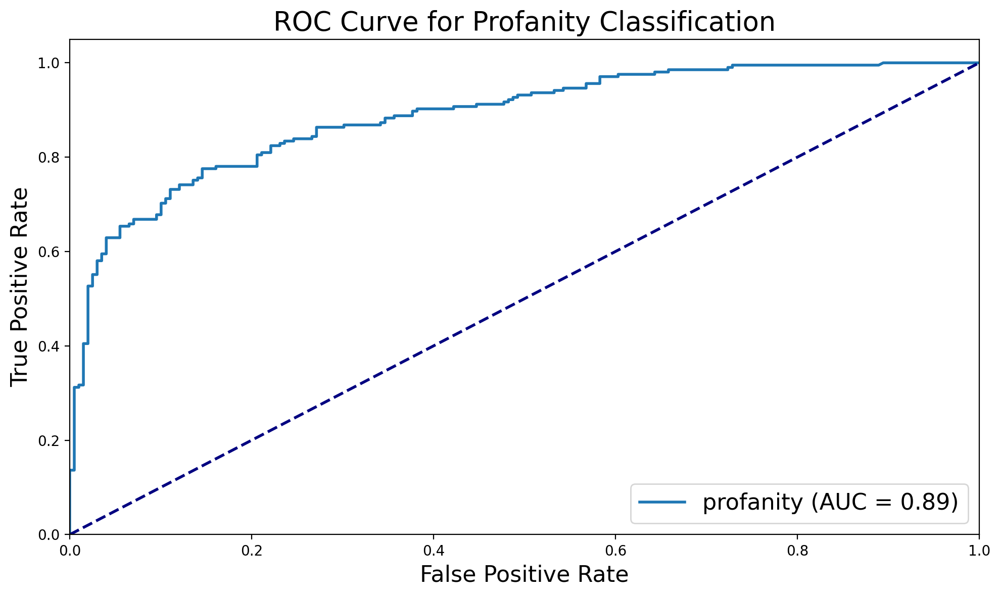

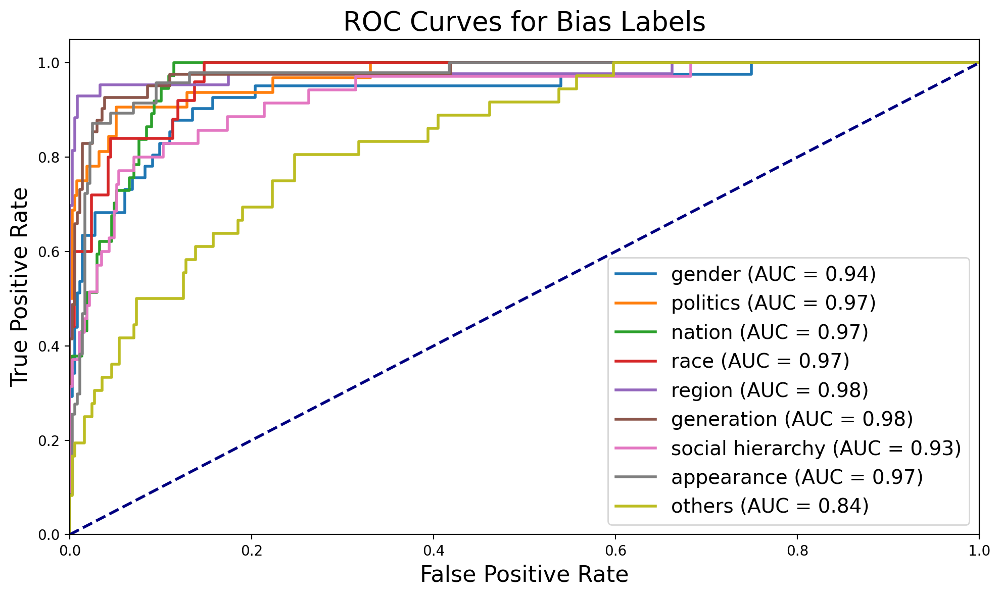

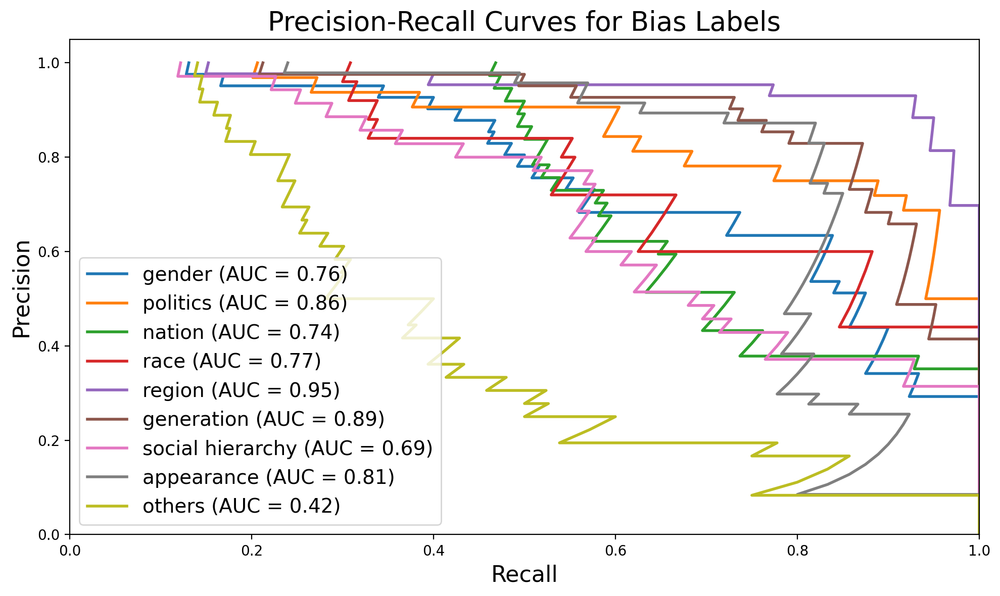


Eval results for Preference.
accuracy : 50.99
f1-macro : 46.79
preference_mae:0.6410891089108911
preference_top2_accuracy:0.8044554591178894
preference_top2_f1:0.547802249266335

Eval results for Slang.
accuracy : 80.94
precision : 84.41
recall : 76.59
f1 : 80.31
matthews_corrcoef : 62.2
pr_auc : 0.898999108766926
roc_auc : 0.8867875965191812

Eval results for Gender.
accuracy : 90.35
precision : 51.61
recall : 78.05
f1 : 62.14
matthews_corrcoef : 58.46
pr_auc : 0.7606877348031607
roc_auc : 0.9354968756299133

Eval results for Politic.
accuracy : 93.32
precision : 54.72
recall : 90.62
f1 : 68.24
matthews_corrcoef : 67.33
pr_auc : 0.8633851596356356
roc_auc : 0.971606182795699

Eval results for Nation.
accuracy : 90.84
precision : 50.0
recall : 91.89
f1 : 64.76
matthews_corrcoef : 63.7
pr_auc : 0.7437719608528492
roc_auc : 0.9653140879298918

Eval results for Race.
accuracy : 88.61
precision : 33.85
recall : 88.0
f1 : 48.89
matthews_corrcoef : 50.27
pr_auc : 0.772672333839318
roc_auc :

epoch: 3, train loss: 7.5845: 100%|██████████████████████████████████████| 3836/3836 [22:26<00:00,  2.85it/s]


Preference Accuracy per class
Class 1: 70.35%
Class 2: 39.87%
Class 3: 71.57%
Class 4: 31.62%
Class 5: 27.09%


epoch: 3, valid loss: 11.1391: 100%|███████████████████████████████████████| 101/101 [00:06<00:00, 15.35it/s]


Preference Accuracy per class
Class 1: 86.59%
Class 2: 52.56%
Class 3: 63.37%
Class 4: 31.88%
Class 5: 40.54%


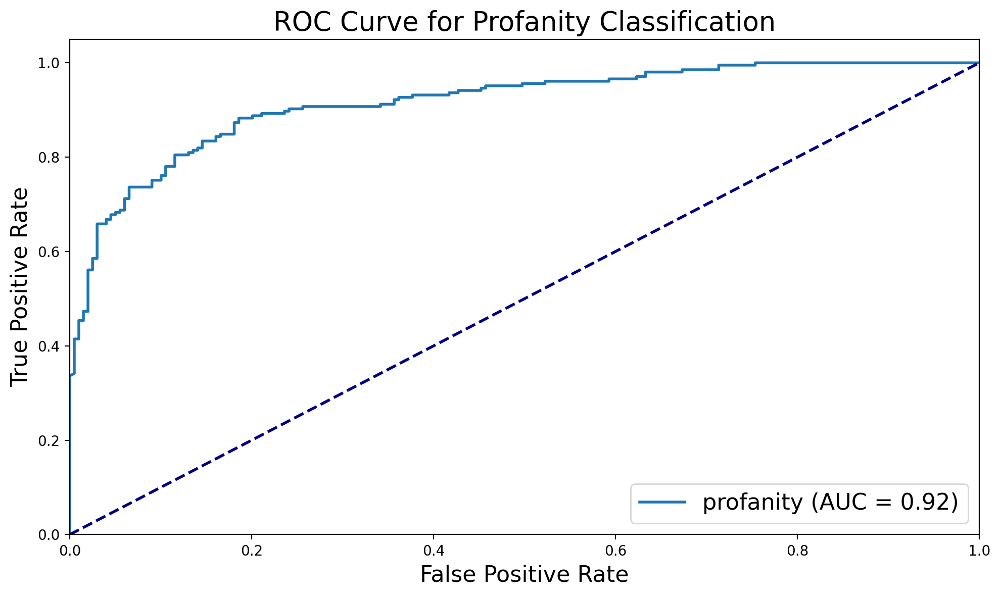

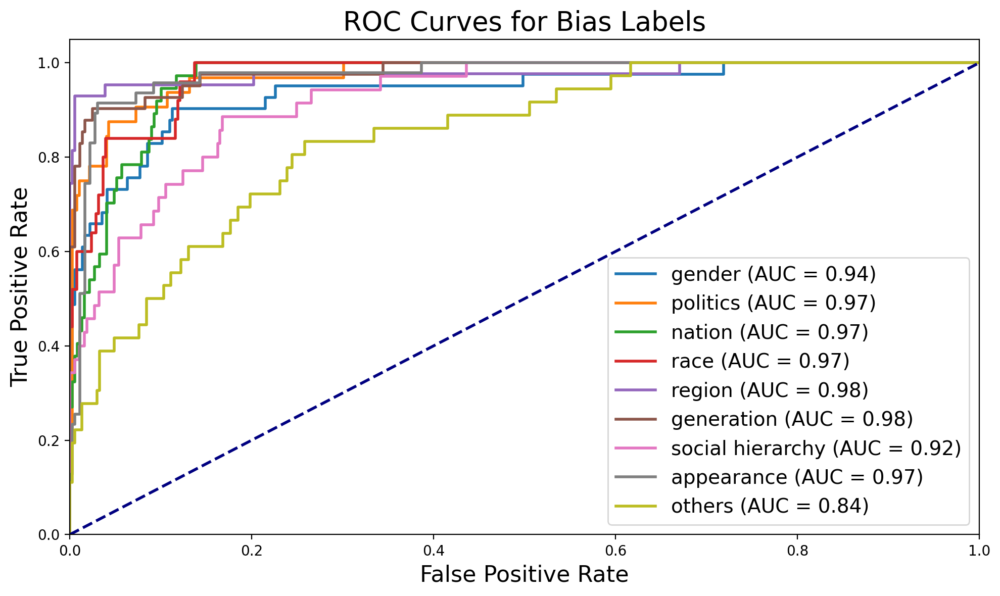

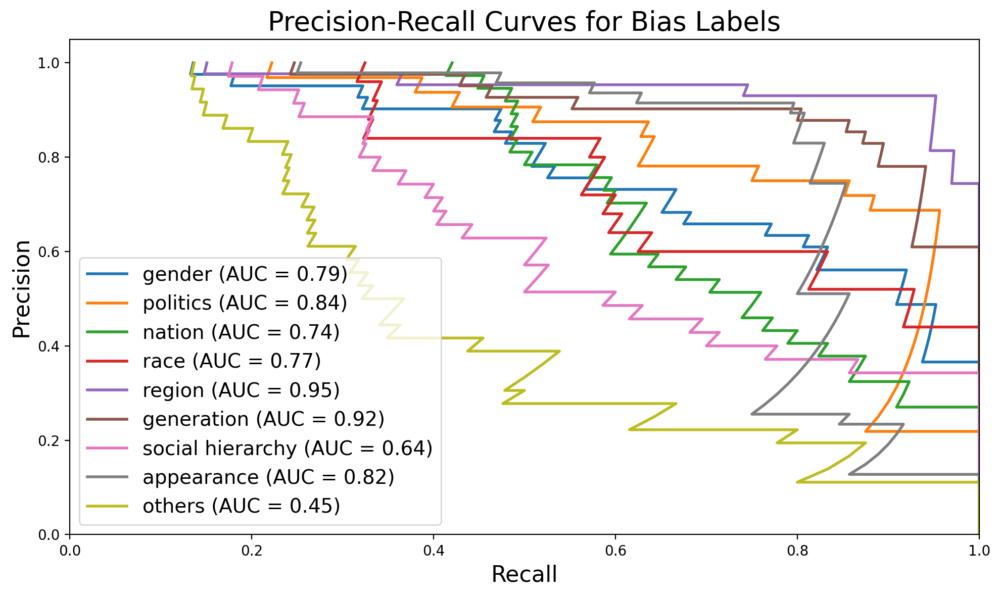


Eval results for Preference.
accuracy : 56.44
f1-macro : 54.65
preference_mae:0.5742574257425742
preference_top2_accuracy:0.8292078971862793
preference_top2_f1:0.5652831437560193

Eval results for Slang.
accuracy : 82.67
precision : 88.14
recall : 76.1
f1 : 81.68
matthews_corrcoef : 66.05
pr_auc : 0.9277170975360598
roc_auc : 0.9161294276259346

Eval results for Gender.
accuracy : 93.56
precision : 66.67
recall : 73.17
f1 : 69.77
matthews_corrcoef : 66.26
pr_auc : 0.7856940792328109
roc_auc : 0.9387892226029697

Eval results for Politic.
accuracy : 89.6
precision : 42.65
recall : 90.62
f1 : 58.0
matthews_corrcoef : 57.85
pr_auc : 0.8398324597582537
roc_auc : 0.974462365591398

Eval results for Nation.
accuracy : 90.35
precision : 48.57
recall : 91.89
f1 : 63.55
matthews_corrcoef : 62.56
pr_auc : 0.7435381205382998
roc_auc : 0.9652404448044775

Eval results for Race.
accuracy : 91.34
precision : 40.38
recall : 84.0
f1 : 54.55
matthews_corrcoef : 54.55
pr_auc : 0.7746379565793942
roc_au

epoch: 4, train loss: 6.9888: 100%|██████████████████████████████████████| 3836/3836 [22:28<00:00,  2.84it/s]


Preference Accuracy per class
Class 1: 69.82%
Class 2: 43.01%
Class 3: 70.92%
Class 4: 39.29%
Class 5: 36.18%


epoch: 4, valid loss: 10.4925: 100%|███████████████████████████████████████| 101/101 [00:06<00:00, 14.71it/s]


Preference Accuracy per class
Class 1: 85.37%
Class 2: 50.00%
Class 3: 67.33%
Class 4: 40.58%
Class 5: 48.65%


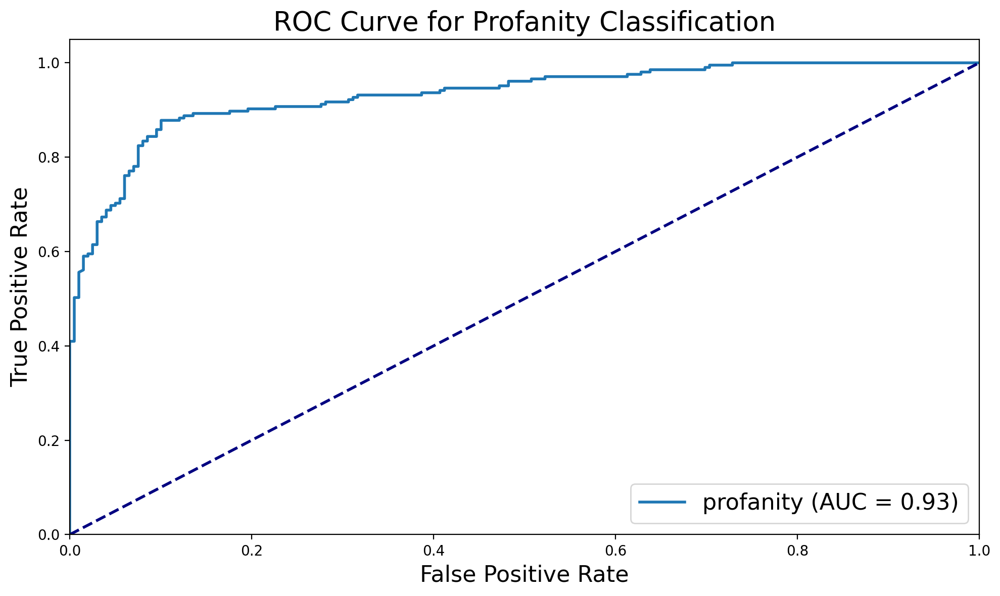

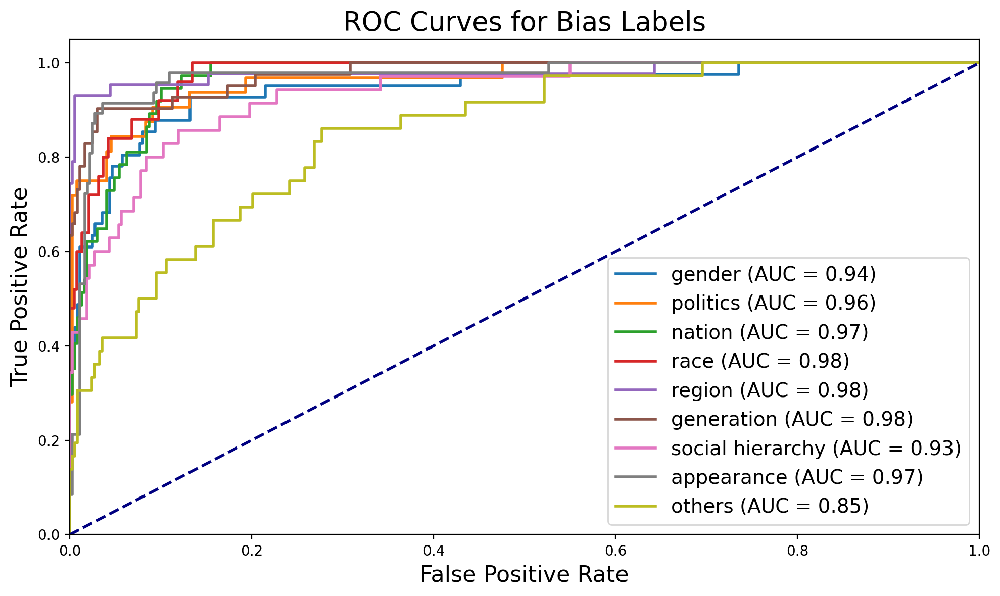

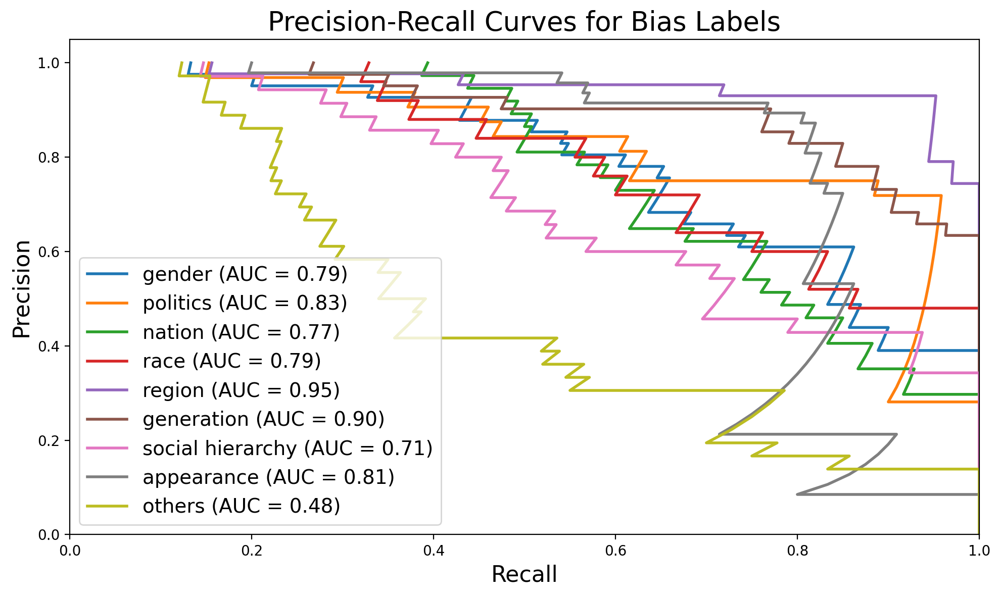


Eval results for Preference.
accuracy : 59.65
f1-macro : 58.39
preference_mae:0.5297029702970297
preference_top2_accuracy:0.8316831588745117
preference_top2_f1:0.5670208982138358

Eval results for Slang.
accuracy : 86.63
precision : 91.71
recall : 80.98
f1 : 86.01
matthews_corrcoef : 73.83
pr_auc : 0.9431426382467791
roc_auc : 0.9321853168280426

Eval results for Gender.
accuracy : 92.57
precision : 60.0
recall : 80.49
f1 : 68.75
matthews_corrcoef : 65.54
pr_auc : 0.7862916899725015
roc_auc : 0.9438285291943829

Eval results for Politic.
accuracy : 92.08
precision : 50.0
recall : 84.38
f1 : 62.79
matthews_corrcoef : 61.2
pr_auc : 0.8318720654602036
roc_auc : 0.9641297043010753

Eval results for Nation.
accuracy : 90.84
precision : 50.0
recall : 83.78
f1 : 62.63
matthews_corrcoef : 60.29
pr_auc : 0.7712601818828777
roc_auc : 0.968112526695633

Eval results for Race.
accuracy : 92.08
precision : 43.14
recall : 88.0
f1 : 57.89
matthews_corrcoef : 58.29
pr_auc : 0.7948793060617716
roc_auc

epoch: 5, train loss: 6.4897: 100%|██████████████████████████████████████| 3836/3836 [22:49<00:00,  2.80it/s]


Preference Accuracy per class
Class 1: 72.02%
Class 2: 44.31%
Class 3: 71.52%
Class 4: 42.86%
Class 5: 43.45%


epoch: 5, valid loss: 10.304: 100%|████████████████████████████████████████| 101/101 [00:06<00:00, 15.29it/s]


Preference Accuracy per class
Class 1: 76.83%
Class 2: 64.10%
Class 3: 67.33%
Class 4: 36.23%
Class 5: 60.81%


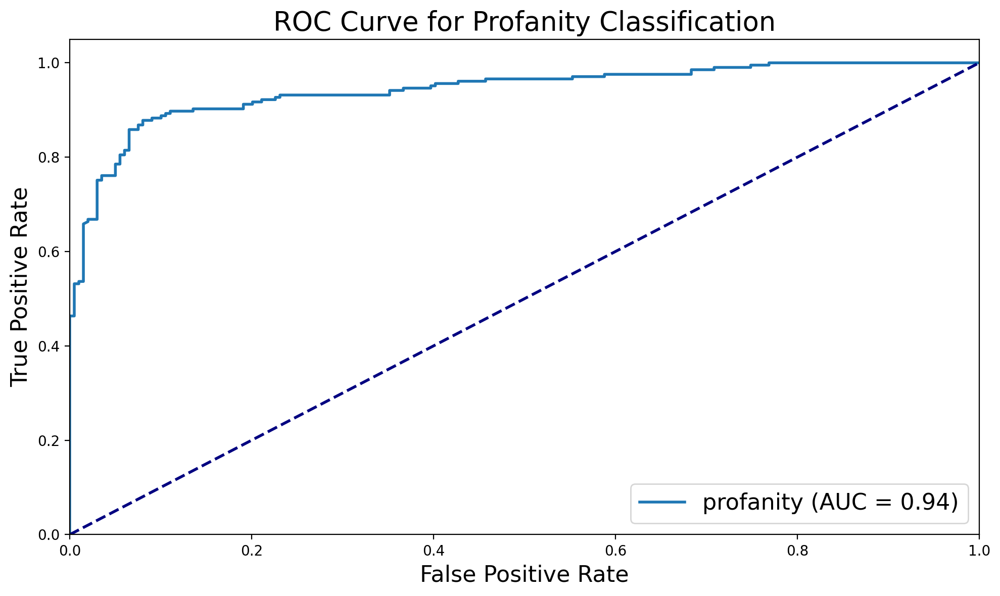

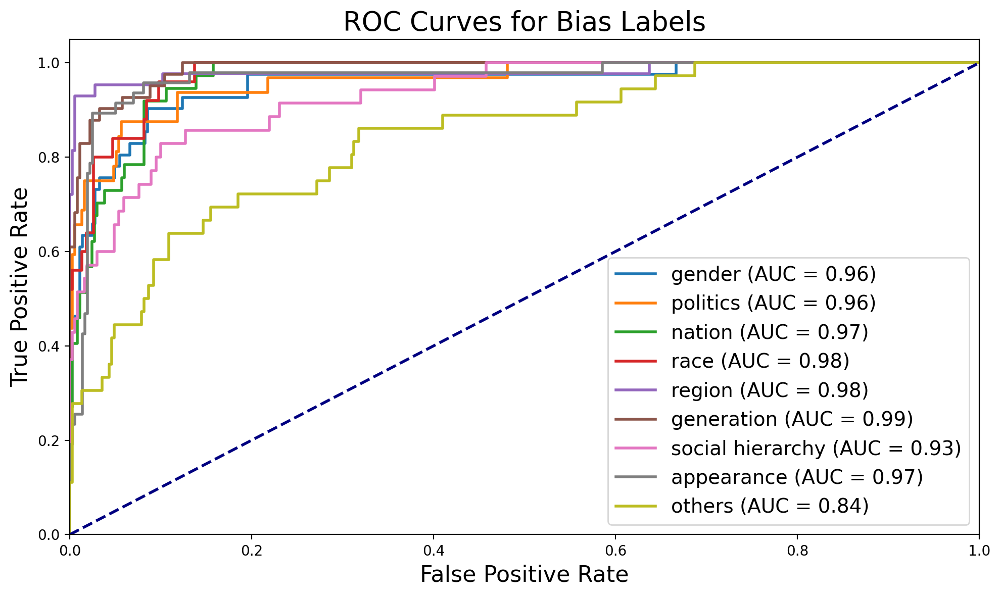

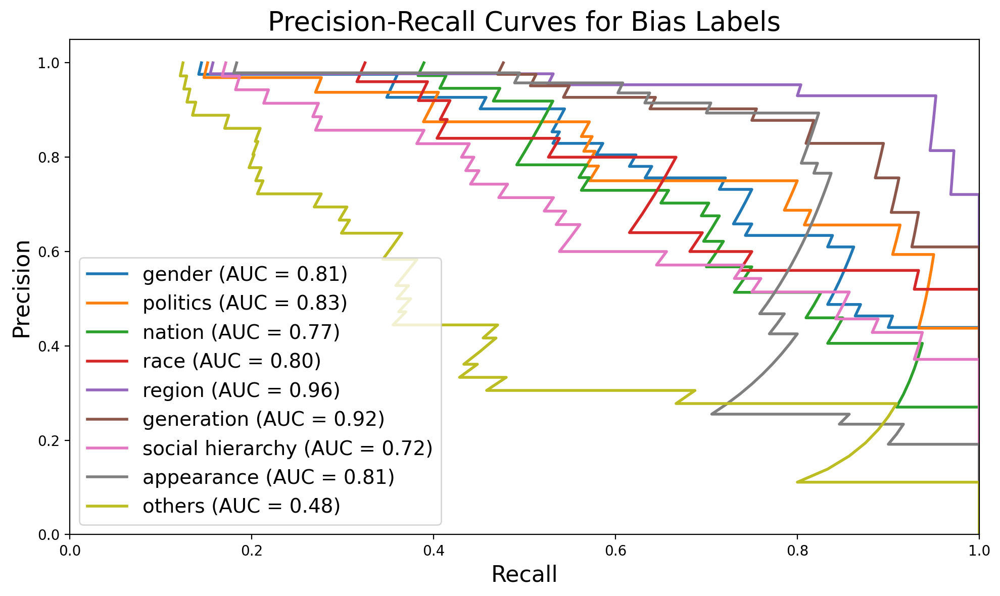


Eval results for Preference.
accuracy : 62.13
f1-macro : 61.37
preference_mae:0.4777227722772277
preference_top2_accuracy:0.8490098714828491
preference_top2_f1:0.5795593622894324

Eval results for Slang.
accuracy : 89.6
precision : 91.79
recall : 87.32
f1 : 89.5
matthews_corrcoef : 79.32
pr_auc : 0.9530839476677809
roc_auc : 0.9421865424684398

Eval results for Gender.
accuracy : 92.08
precision : 57.89
recall : 80.49
f1 : 67.35
matthews_corrcoef : 64.08
pr_auc : 0.8118635513684818
roc_auc : 0.9553853389773567

Eval results for Politic.
accuracy : 95.05
precision : 66.67
recall : 75.0
f1 : 70.59
matthews_corrcoef : 68.04
pr_auc : 0.8259730268395844
roc_auc : 0.9620295698924732

Eval results for Nation.
accuracy : 91.58
precision : 52.38
recall : 89.19
f1 : 66.0
matthews_corrcoef : 64.41
pr_auc : 0.7720542693085481
roc_auc : 0.967817954193976

Eval results for Race.
accuracy : 93.56
precision : 48.84
recall : 84.0
f1 : 61.76
matthews_corrcoef : 61.09
pr_auc : 0.7998026935829424
roc_auc

epoch: 6, train loss: 6.2474: 100%|██████████████████████████████████████| 3836/3836 [22:05<00:00,  2.89it/s]


Preference Accuracy per class
Class 1: 71.40%
Class 2: 47.13%
Class 3: 71.48%
Class 4: 47.41%
Class 5: 42.36%


epoch: 6, valid loss: 9.1398: 100%|████████████████████████████████████████| 101/101 [00:06<00:00, 15.45it/s]


Preference Accuracy per class
Class 1: 81.71%
Class 2: 58.97%
Class 3: 50.50%
Class 4: 55.07%
Class 5: 48.65%


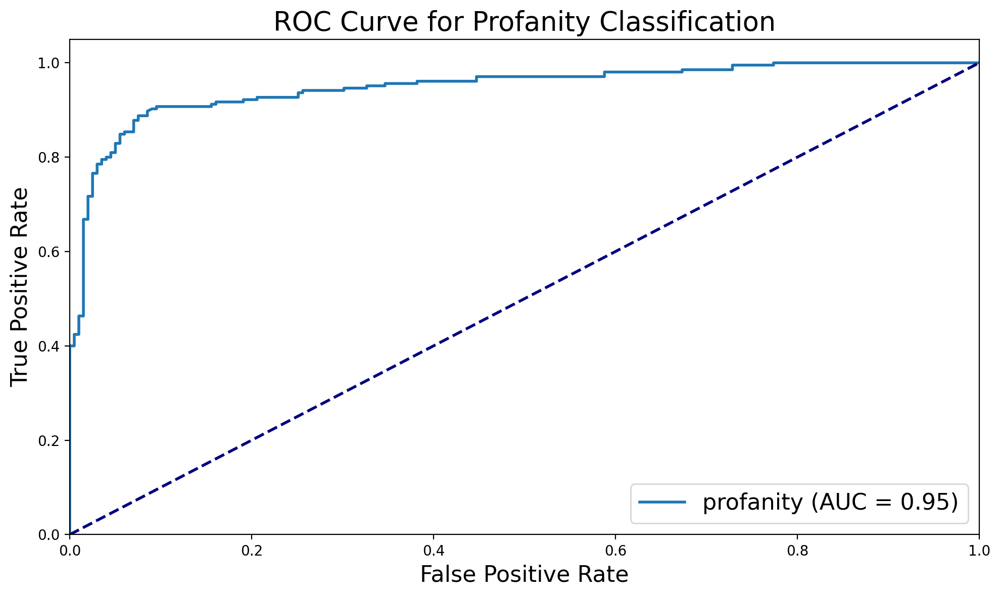

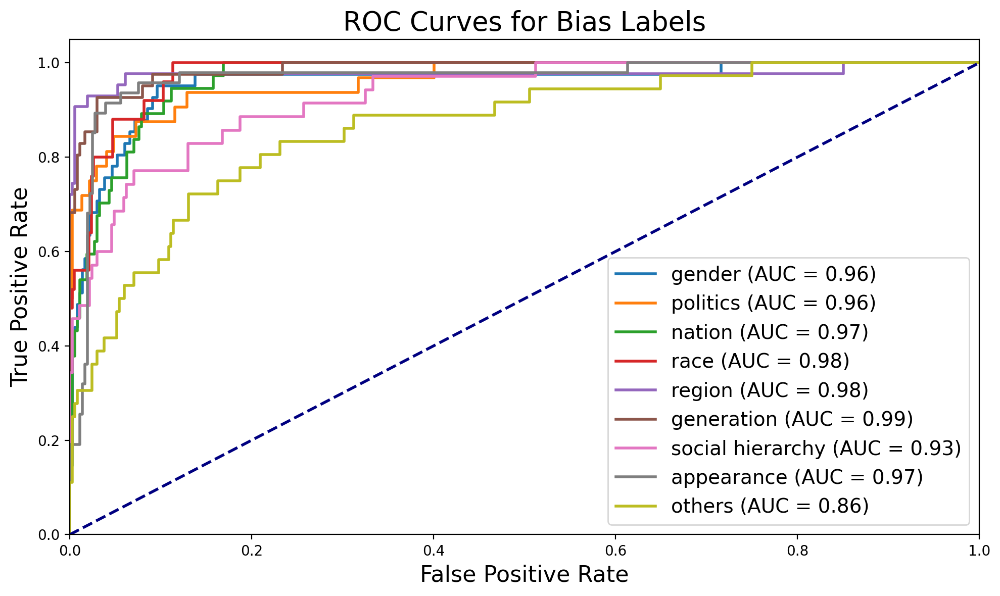

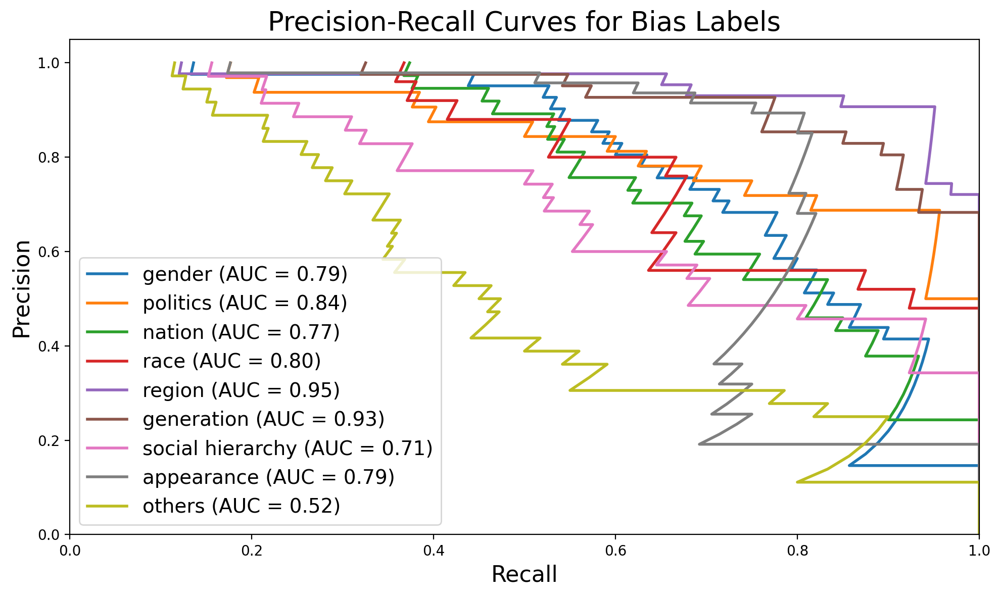


Eval results for Preference.
accuracy : 58.91
f1-macro : 58.86
preference_mae:0.5123762376237624
preference_top2_accuracy:0.8613861203193665
preference_top2_f1:0.5888983558956475

Eval results for Slang.
accuracy : 90.35
precision : 91.92
recall : 88.78
f1 : 90.32
matthews_corrcoef : 80.75
pr_auc : 0.9562174699938815
roc_auc : 0.9480205907586714

Eval results for Gender.
accuracy : 92.33
precision : 58.06
recall : 87.8
f1 : 69.9
matthews_corrcoef : 67.56
pr_auc : 0.7899292836355798
roc_auc : 0.9581401599139958

Eval results for Politic.
accuracy : 94.31
precision : 60.0
recall : 84.38
f1 : 70.13
matthews_corrcoef : 68.27
pr_auc : 0.8387627754501932
roc_auc : 0.9623655913978495

Eval results for Nation.
accuracy : 91.58
precision : 52.46
recall : 86.49
f1 : 65.31
matthews_corrcoef : 63.31
pr_auc : 0.7714326072988422
roc_auc : 0.9673760954414905

Eval results for Race.
accuracy : 92.33
precision : 44.0
recall : 88.0
f1 : 58.67
matthews_corrcoef : 58.98
pr_auc : 0.7990832913273945
roc_au

epoch: 7, train loss: 5.9105: 100%|██████████████████████████████████████| 3836/3836 [21:56<00:00,  2.91it/s]


Preference Accuracy per class
Class 1: 72.34%
Class 2: 48.63%
Class 3: 71.11%
Class 4: 51.67%
Class 5: 43.27%


epoch: 7, valid loss: 9.9463: 100%|████████████████████████████████████████| 101/101 [00:06<00:00, 14.98it/s]


Preference Accuracy per class
Class 1: 84.15%
Class 2: 50.00%
Class 3: 61.39%
Class 4: 47.83%
Class 5: 62.16%


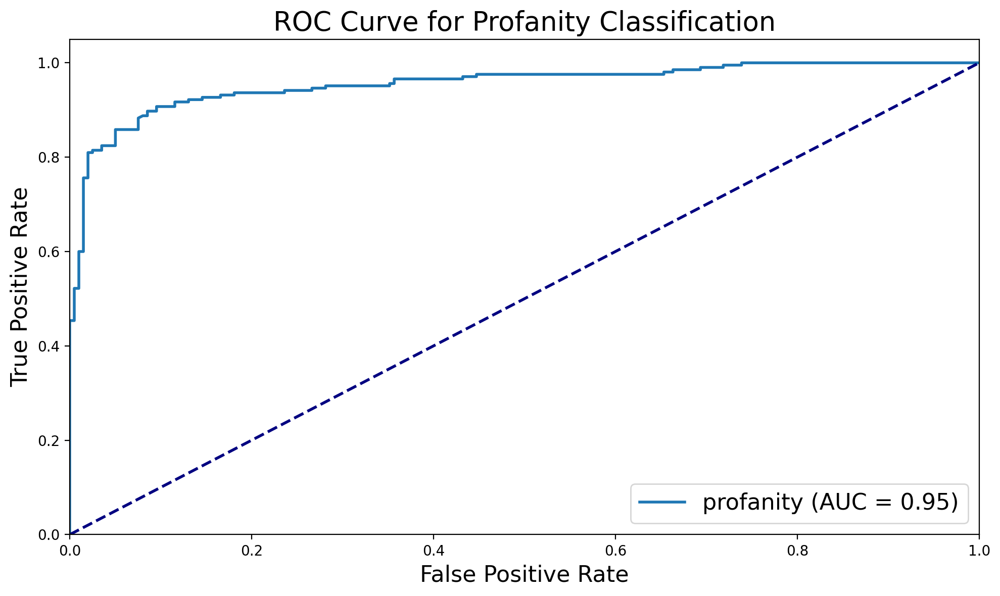

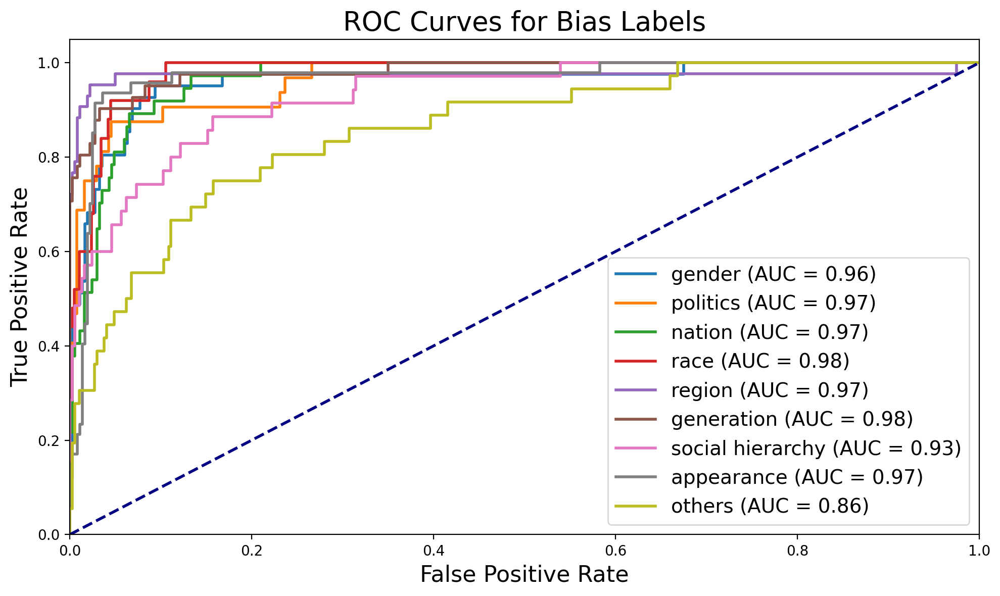

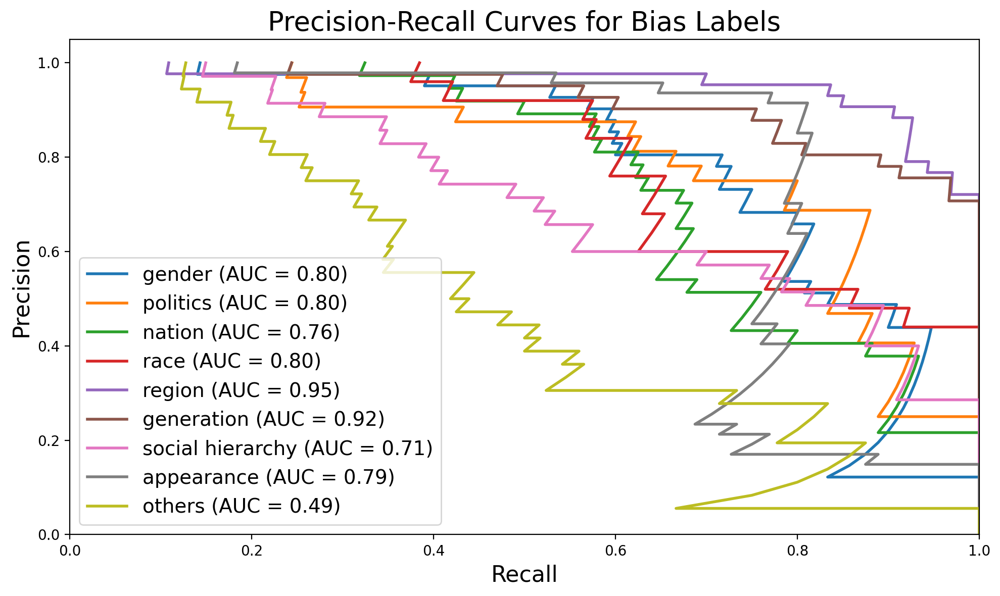


Eval results for Preference.
accuracy : 61.63
f1-macro : 61.17
preference_mae:0.48514851485148514
preference_top2_accuracy:0.8836633563041687
preference_top2_f1:0.6005150022391402

Eval results for Slang.
accuracy : 90.35
precision : 91.5
recall : 89.27
f1 : 90.37
matthews_corrcoef : 80.72
pr_auc : 0.9633270666546896
roc_auc : 0.9548841769824734

Eval results for Gender.
accuracy : 92.82
precision : 59.68
recall : 90.24
f1 : 71.84
matthews_corrcoef : 69.84
pr_auc : 0.7997196123291379
roc_auc : 0.960894980850635

Eval results for Politic.
accuracy : 95.05
precision : 65.0
recall : 81.25
f1 : 72.22
matthews_corrcoef : 70.06
pr_auc : 0.8026122944034567
roc_auc : 0.9655577956989247

Eval results for Nation.
accuracy : 93.32
precision : 60.0
recall : 81.08
f1 : 68.97
matthews_corrcoef : 66.24
pr_auc : 0.7579890494089707
roc_auc : 0.9671551660652479

Eval results for Race.
accuracy : 95.3
precision : 57.5
recall : 92.0
f1 : 70.77
matthews_corrcoef : 70.6
pr_auc : 0.802063375831997
roc_auc :

epoch: 8, train loss: 5.787: 100%|███████████████████████████████████████| 3836/3836 [21:54<00:00,  2.92it/s]


Preference Accuracy per class
Class 1: 73.22%
Class 2: 49.24%
Class 3: 71.44%
Class 4: 53.63%
Class 5: 48.18%


epoch: 8, valid loss: 10.2607: 100%|███████████████████████████████████████| 101/101 [00:06<00:00, 15.38it/s]


Preference Accuracy per class
Class 1: 80.49%
Class 2: 61.54%
Class 3: 58.42%
Class 4: 55.07%
Class 5: 54.05%


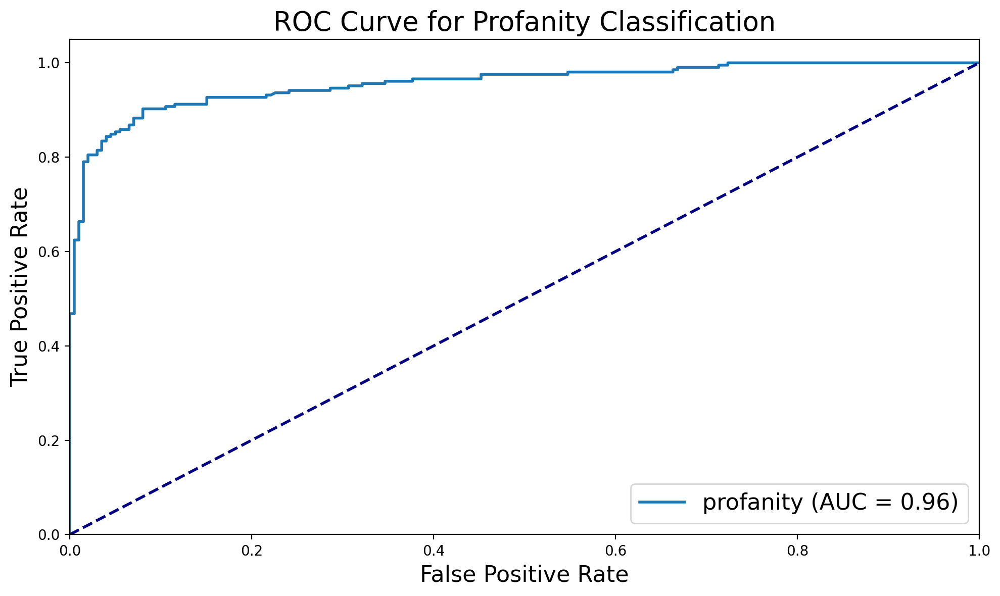

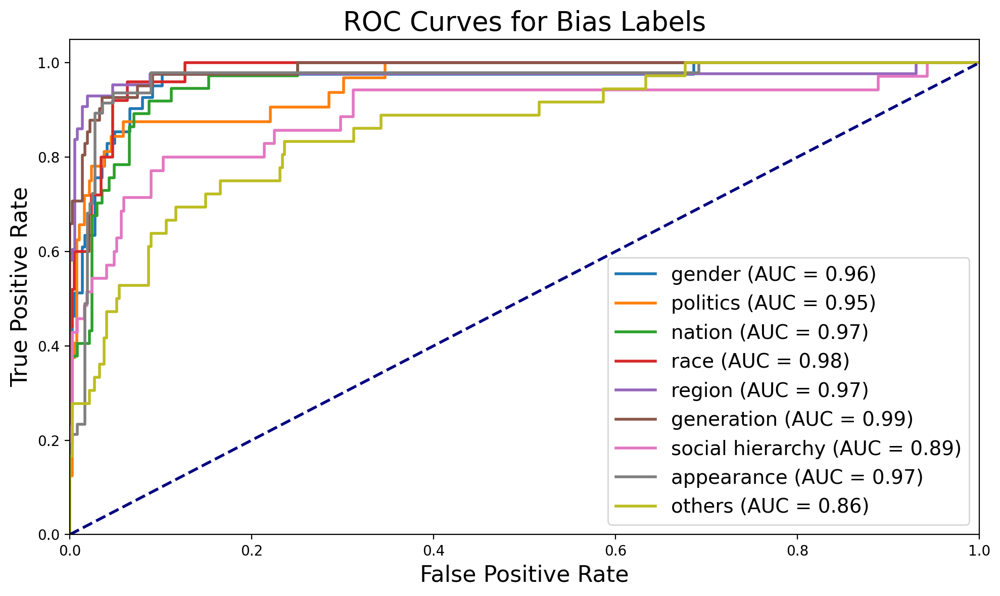

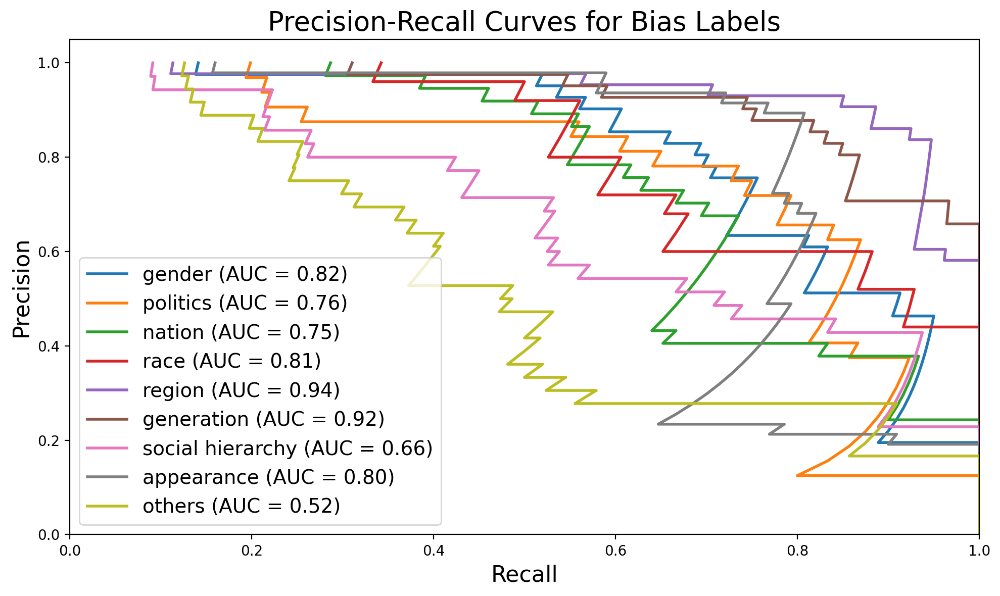


Eval results for Preference.
accuracy : 62.13
f1-macro : 62.12
preference_mae:0.45792079207920794
preference_top2_accuracy:0.8836633563041687
preference_top2_f1:0.6026839088087994

Eval results for Slang.
accuracy : 90.1
precision : 91.88
recall : 88.29
f1 : 90.05
matthews_corrcoef : 80.27
pr_auc : 0.9649679981511927
roc_auc : 0.9560853045716387

Eval results for Gender.
accuracy : 92.82
precision : 60.34
recall : 85.37
f1 : 70.71
matthews_corrcoef : 68.06
pr_auc : 0.8176768542181853
roc_auc : 0.963246657259961

Eval results for Politic.
accuracy : 94.31
precision : 60.47
recall : 81.25
f1 : 69.33
matthews_corrcoef : 67.15
pr_auc : 0.7623584190644291
roc_auc : 0.954133064516129

Eval results for Nation.
accuracy : 92.82
precision : 58.0
recall : 78.38
f1 : 66.67
matthews_corrcoef : 63.64
pr_auc : 0.7514263030451339
roc_auc : 0.9650931585536491

Eval results for Race.
accuracy : 94.55
precision : 53.49
recall : 92.0
f1 : 67.65
matthews_corrcoef : 67.75
pr_auc : 0.809600252970283
roc_au

epoch: 9, train loss: 5.5642: 100%|██████████████████████████████████████| 3836/3836 [21:58<00:00,  2.91it/s]


Preference Accuracy per class
Class 1: 72.28%
Class 2: 51.14%
Class 3: 71.27%
Class 4: 55.13%
Class 5: 51.45%


epoch: 9, valid loss: 10.1902: 100%|███████████████████████████████████████| 101/101 [00:06<00:00, 15.47it/s]


Preference Accuracy per class
Class 1: 81.71%
Class 2: 57.69%
Class 3: 57.43%
Class 4: 55.07%
Class 5: 50.00%


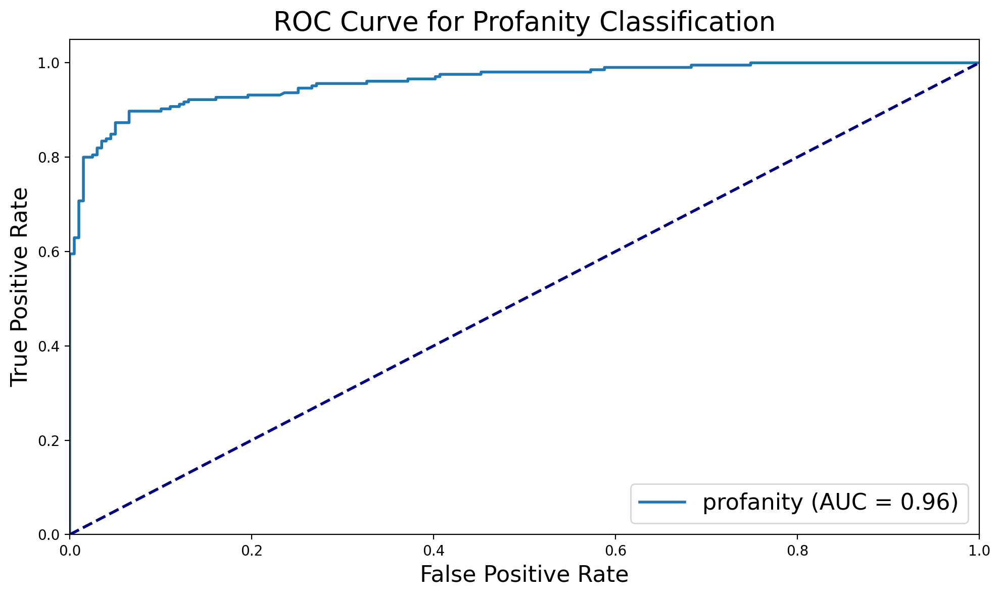

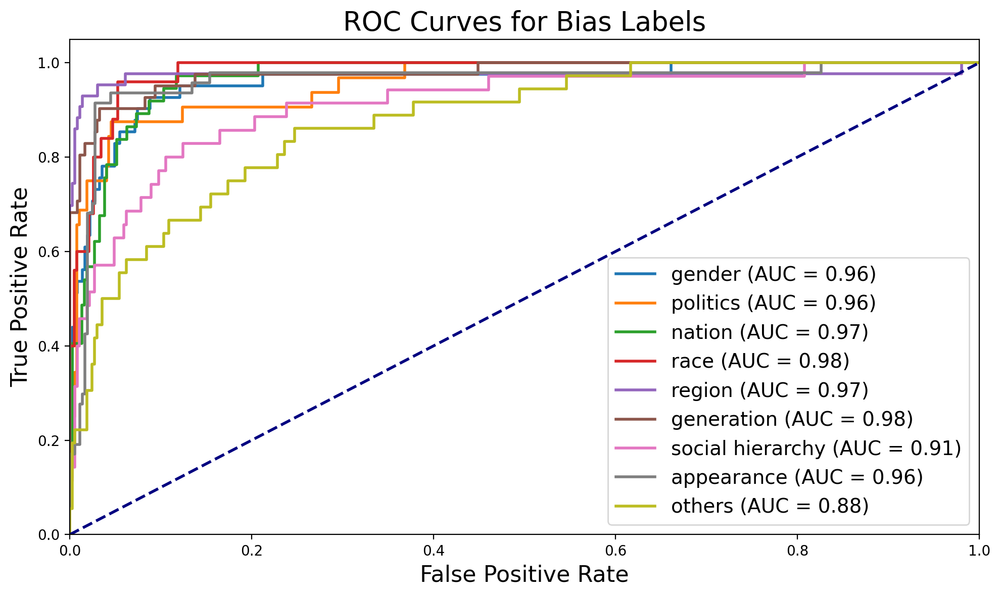

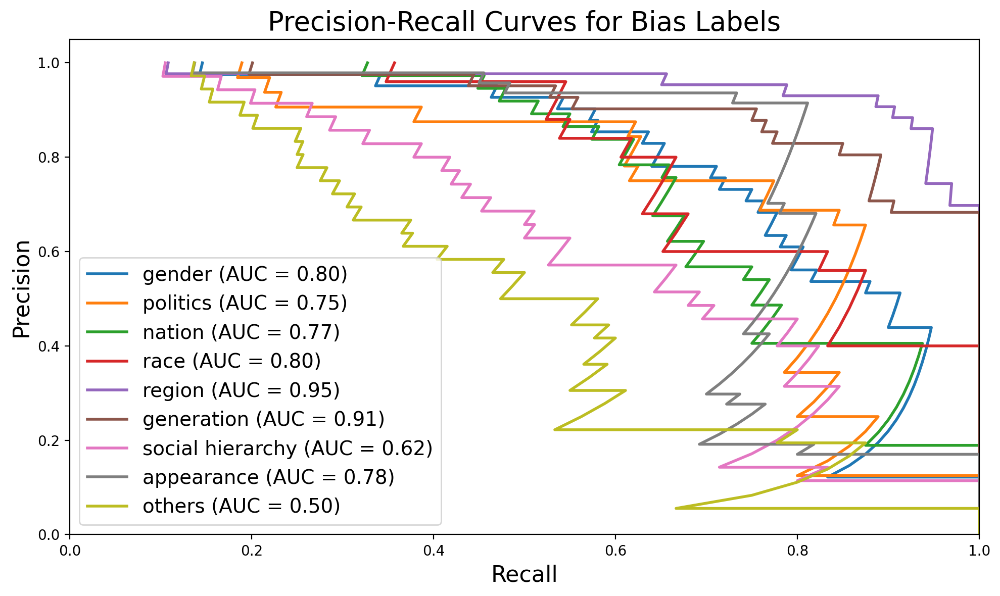


Eval results for Preference.
accuracy : 60.64
f1-macro : 60.39
preference_mae:0.48267326732673266
preference_top2_accuracy:0.8688119053840637
preference_top2_f1:0.5939150379720038

Eval results for Slang.
accuracy : 90.35
precision : 91.09
recall : 89.76
f1 : 90.42
matthews_corrcoef : 80.7
pr_auc : 0.9682343203893639
roc_auc : 0.9600808922662091

Eval results for Gender.
accuracy : 93.81
precision : 65.38
recall : 82.93
f1 : 73.12
matthews_corrcoef : 70.31
pr_auc : 0.7972931826217768
roc_auc : 0.9591480212322784

Eval results for Politic.
accuracy : 95.05
precision : 66.67
recall : 75.0
f1 : 70.59
matthews_corrcoef : 68.04
pr_auc : 0.7542164063376489
roc_auc : 0.9568212365591398

Eval results for Nation.
accuracy : 93.32
precision : 59.62
recall : 83.78
f1 : 69.66
matthews_corrcoef : 67.24
pr_auc : 0.76511995568929
roc_auc : 0.9690698873260181

Eval results for Race.
accuracy : 94.55
precision : 53.49
recall : 92.0
f1 : 67.65
matthews_corrcoef : 67.75
pr_auc : 0.8043831026580262
roc_a

epoch: 10, train loss: 5.0521: 100%|█████████████████████████████████████| 3836/3836 [21:54<00:00,  2.92it/s]


Preference Accuracy per class
Class 1: 73.01%
Class 2: 52.86%
Class 3: 71.05%
Class 4: 58.12%
Class 5: 54.00%


epoch: 10, valid loss: 9.4058: 100%|███████████████████████████████████████| 101/101 [00:06<00:00, 15.35it/s]


Preference Accuracy per class
Class 1: 84.15%
Class 2: 56.41%
Class 3: 56.44%
Class 4: 50.72%
Class 5: 66.22%


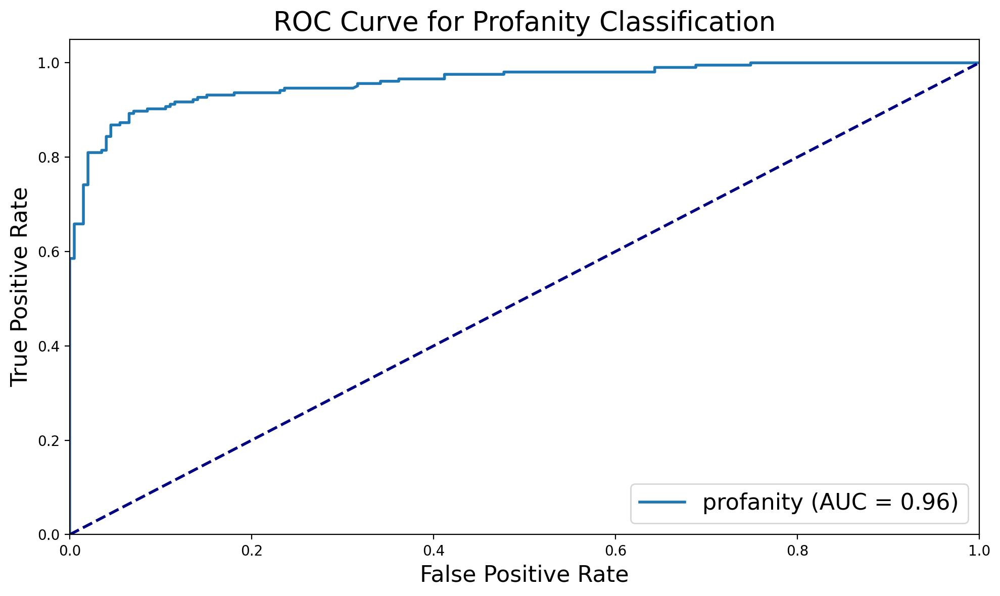

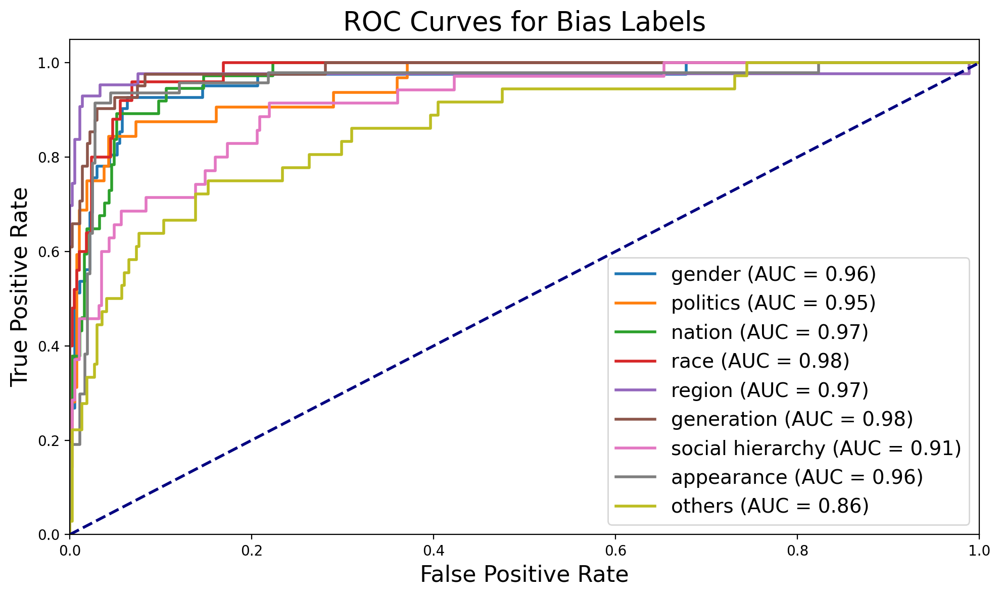

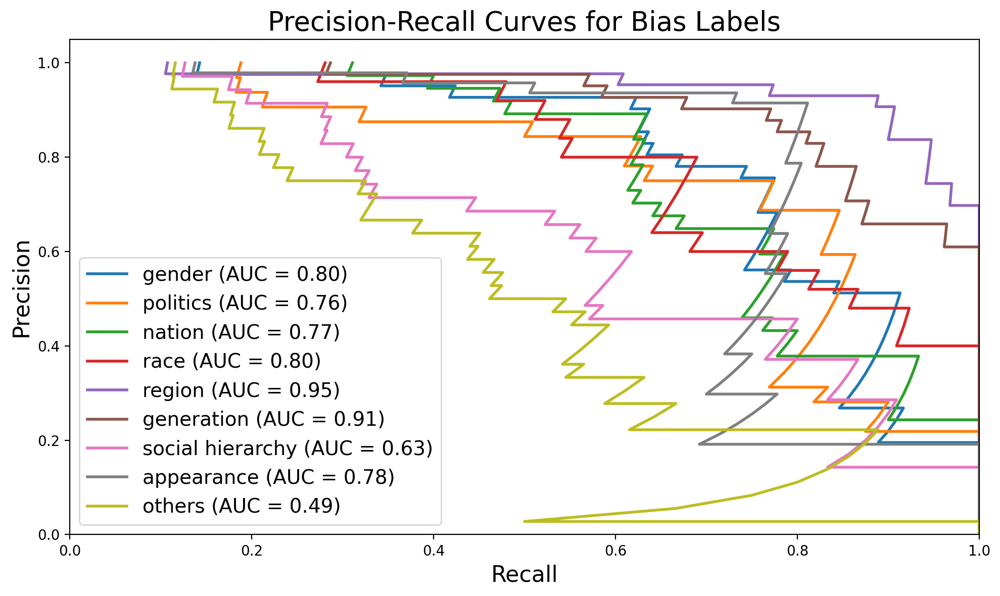


Eval results for Preference.
accuracy : 62.87
f1-macro : 62.62
preference_mae:0.45792079207920794
preference_top2_accuracy:0.8861386179924011
preference_top2_f1:0.6038973478519338

Eval results for Slang.
accuracy : 89.85
precision : 89.05
recall : 91.22
f1 : 90.12
matthews_corrcoef : 79.72
pr_auc : 0.9677392564499729
roc_auc : 0.959247456796176

Eval results for Gender.
accuracy : 93.56
precision : 64.71
recall : 80.49
f1 : 71.74
matthews_corrcoef : 68.67
pr_auc : 0.7994297804886292
roc_auc : 0.9593495934959351

Eval results for Politic.
accuracy : 95.54
precision : 70.59
recall : 75.0
f1 : 72.73
matthews_corrcoef : 70.34
pr_auc : 0.7609982301592584
roc_auc : 0.952116935483871

Eval results for Nation.
accuracy : 93.81
precision : 62.0
recall : 83.78
f1 : 71.26
matthews_corrcoef : 68.85
pr_auc : 0.773979874369213
roc_auc : 0.9688489579497753

Eval results for Race.
accuracy : 93.56
precision : 48.94
recall : 92.0
f1 : 63.89
matthews_corrcoef : 64.38
pr_auc : 0.8003377666252899
roc_au

epoch: 11, train loss: 4.9704: 100%|█████████████████████████████████████| 3836/3836 [21:49<00:00,  2.93it/s]


Preference Accuracy per class
Class 1: 73.31%
Class 2: 54.05%
Class 3: 71.90%
Class 4: 58.93%
Class 5: 52.18%


epoch: 11, valid loss: 11.272: 100%|███████████████████████████████████████| 101/101 [00:06<00:00, 15.19it/s]


Preference Accuracy per class
Class 1: 84.15%
Class 2: 53.85%
Class 3: 57.43%
Class 4: 55.07%
Class 5: 62.16%


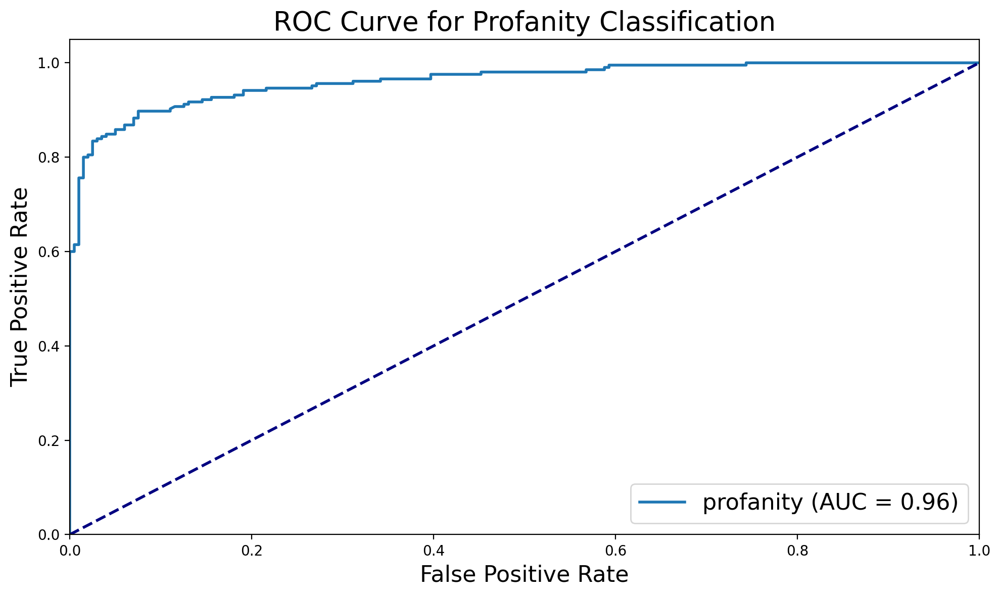

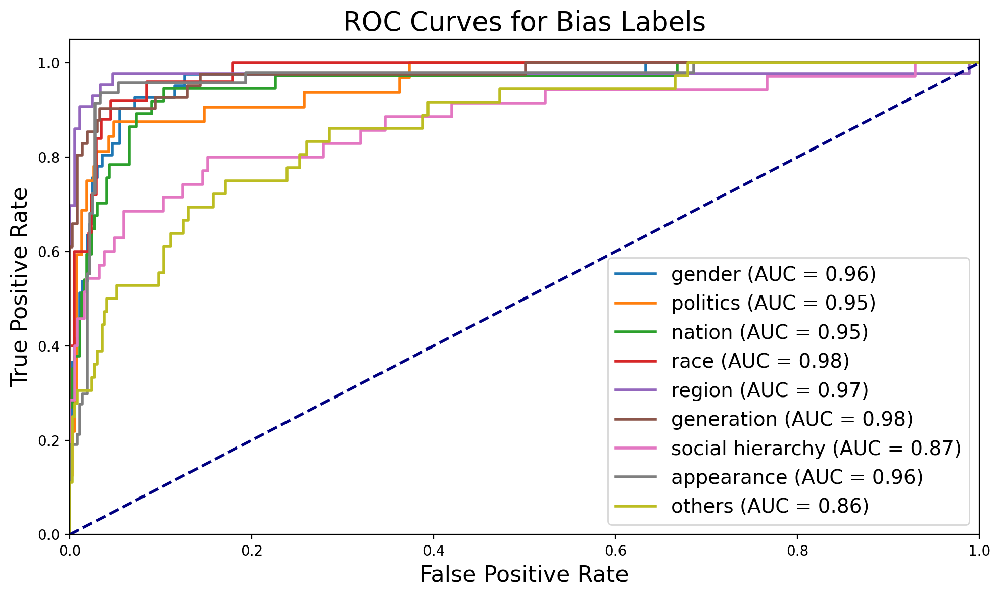

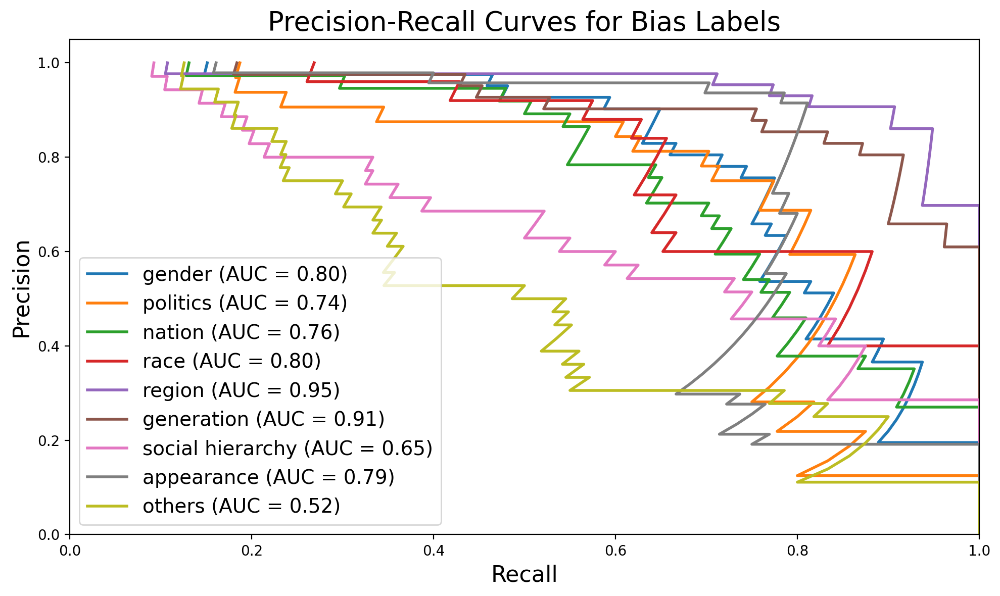


Eval results for Preference.
accuracy : 62.62
f1-macro : 62.43
preference_mae:0.46782178217821785
preference_top2_accuracy:0.8910890817642212
preference_top2_f1:0.6060963651441195

Eval results for Slang.
accuracy : 90.59
precision : 91.54
recall : 89.76
f1 : 90.64
matthews_corrcoef : 81.21
pr_auc : 0.96922197865508
roc_auc : 0.9616251991665646

Eval results for Gender.
accuracy : 93.81
precision : 66.0
recall : 80.49
f1 : 72.53
matthews_corrcoef : 69.51
pr_auc : 0.8036057588116152
roc_auc : 0.9631122757508568

Eval results for Politic.
accuracy : 95.79
precision : 72.73
recall : 75.0
f1 : 73.85
matthews_corrcoef : 71.57
pr_auc : 0.7447558540095567
roc_auc : 0.954133064516129

Eval results for Nation.
accuracy : 94.06
precision : 64.44
recall : 78.38
f1 : 70.73
matthews_corrcoef : 67.86
pr_auc : 0.7634298422470157
roc_auc : 0.9536048309890272

Eval results for Race.
accuracy : 94.55
precision : 53.49
recall : 92.0
f1 : 67.65
matthews_corrcoef : 67.75
pr_auc : 0.802690050775183
roc_auc

epoch: 12, train loss: 4.5257: 100%|█████████████████████████████████████| 3836/3836 [21:52<00:00,  2.92it/s]


Preference Accuracy per class
Class 1: 73.57%
Class 2: 55.21%
Class 3: 71.41%
Class 4: 61.98%
Class 5: 54.00%


epoch: 12, valid loss: 11.0239: 100%|██████████████████████████████████████| 101/101 [00:06<00:00, 15.04it/s]


Preference Accuracy per class
Class 1: 82.93%
Class 2: 60.26%
Class 3: 55.45%
Class 4: 49.28%
Class 5: 64.86%


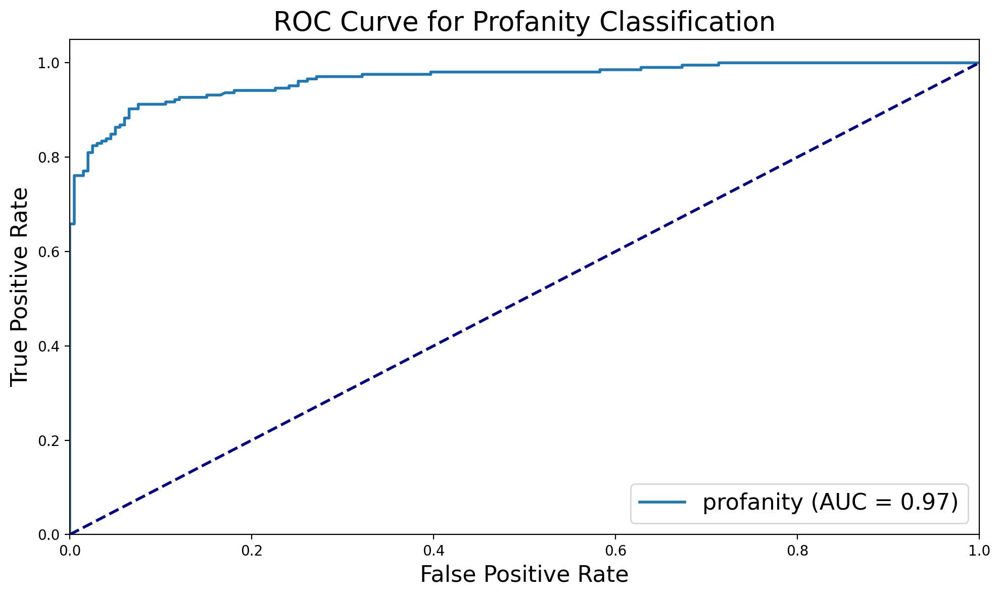

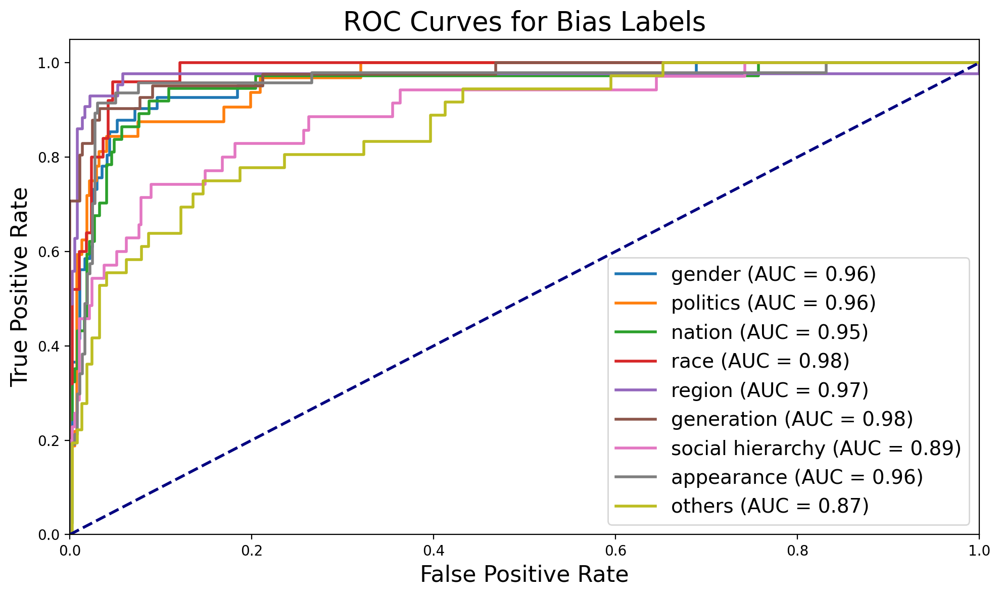

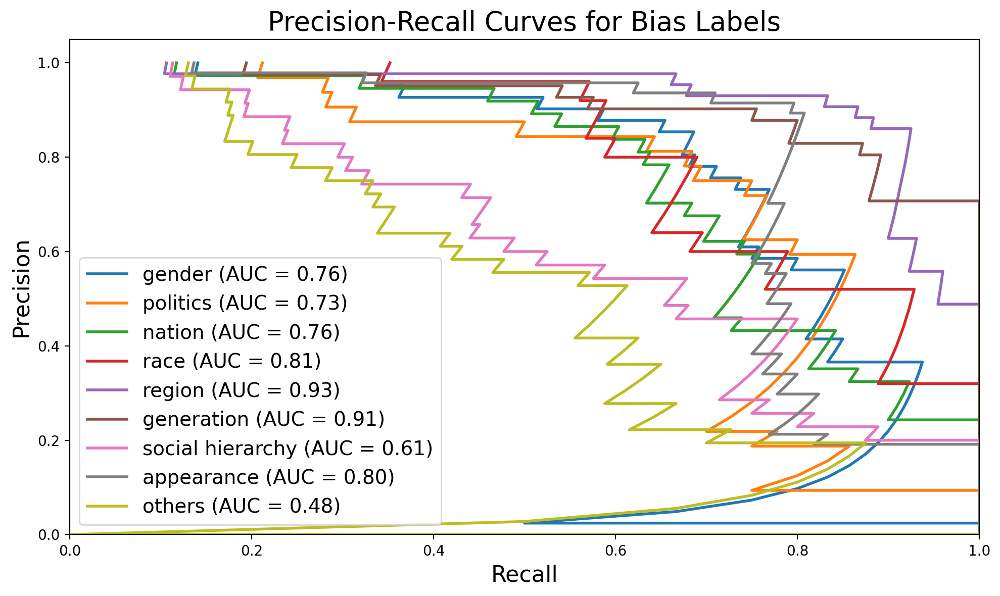


Eval results for Preference.
accuracy : 62.62
f1-macro : 62.64
preference_mae:0.4504950495049505
preference_top2_accuracy:0.896039605140686
preference_top2_f1:0.6106540301833311

Eval results for Slang.
accuracy : 90.1
precision : 89.1
recall : 91.71
f1 : 90.38
matthews_corrcoef : 80.22
pr_auc : 0.9728790062684889
roc_auc : 0.9657188380929035

Eval results for Gender.
accuracy : 93.32
precision : 62.07
recall : 87.8
f1 : 72.73
matthews_corrcoef : 70.4
pr_auc : 0.7555316271449356
roc_auc : 0.9564603910501914

Eval results for Politic.
accuracy : 95.54
precision : 68.42
recall : 81.25
f1 : 74.29
matthews_corrcoef : 72.18
pr_auc : 0.7258872294465472
roc_auc : 0.9600974462365591

Eval results for Nation.
accuracy : 94.06
precision : 64.44
recall : 78.38
f1 : 70.73
matthews_corrcoef : 67.86
pr_auc : 0.7587402420460234
roc_auc : 0.9522056116061567

Eval results for Race.
accuracy : 95.54
precision : 60.0
recall : 84.0
f1 : 70.0
matthews_corrcoef : 68.78
pr_auc : 0.8052194730386184
roc_auc :

epoch: 13, train loss: 4.2577: 100%|█████████████████████████████████████| 3836/3836 [21:51<00:00,  2.93it/s]


Preference Accuracy per class
Class 1: 74.01%
Class 2: 57.00%
Class 3: 71.35%
Class 4: 63.31%
Class 5: 58.36%


epoch: 13, valid loss: 9.6429: 100%|███████████████████████████████████████| 101/101 [00:06<00:00, 15.29it/s]


Preference Accuracy per class
Class 1: 84.15%
Class 2: 56.41%
Class 3: 51.49%
Class 4: 56.52%
Class 5: 67.57%


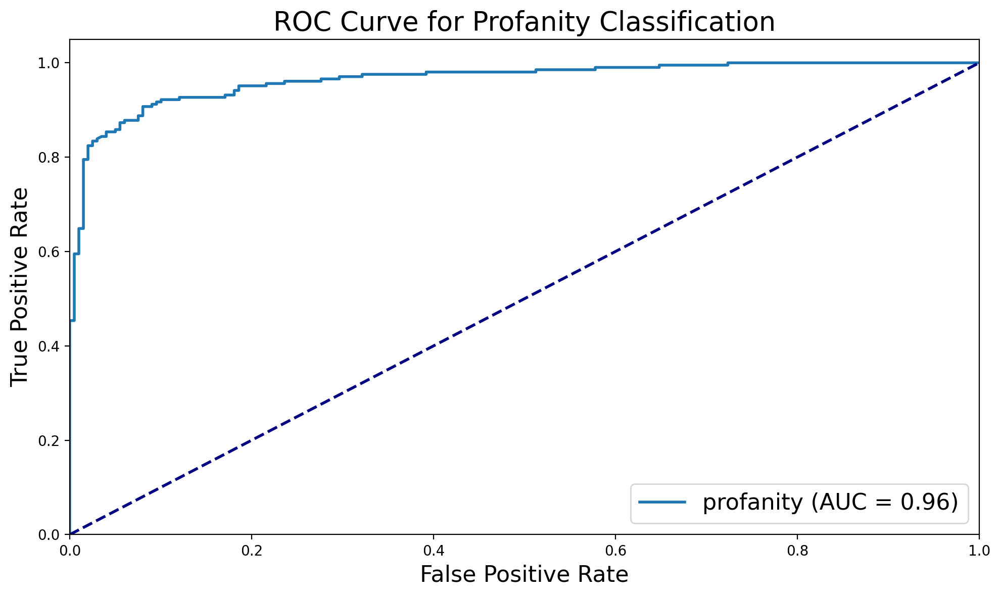

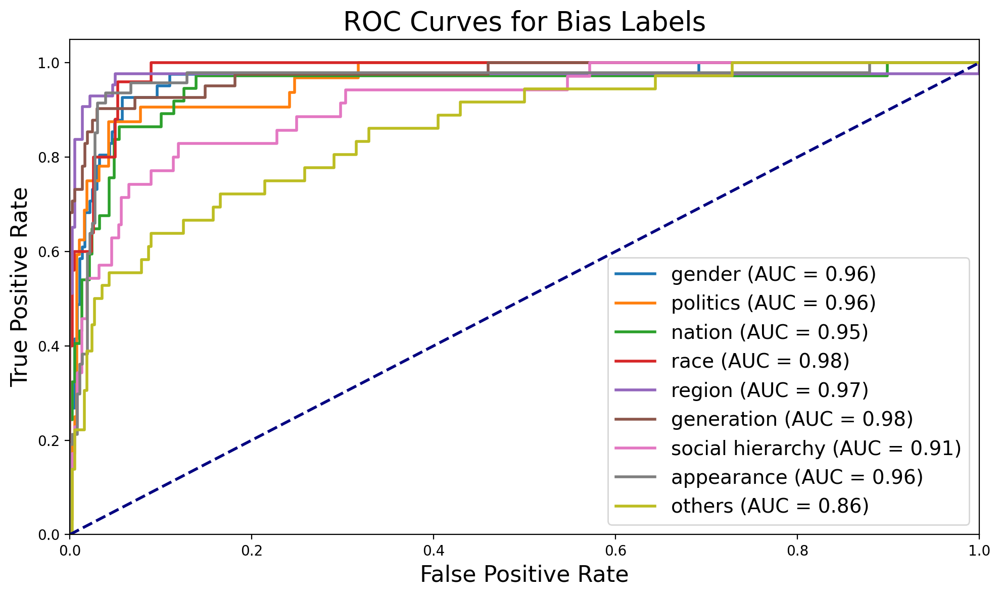

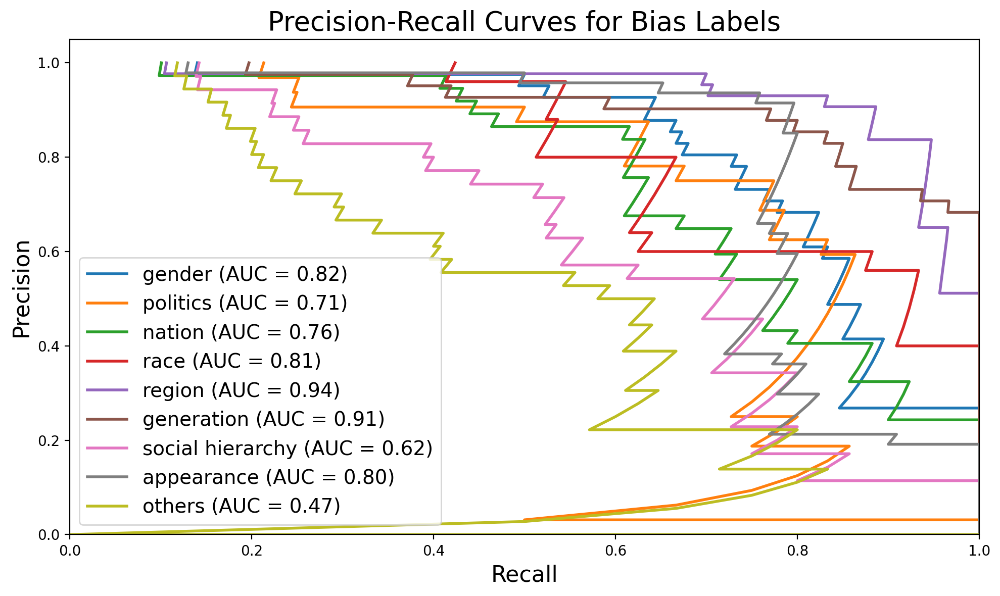


Eval results for Preference.
accuracy : 62.87
f1-macro : 63.06
preference_mae:0.45792079207920794
preference_top2_accuracy:0.8985148668289185
preference_top2_f1:0.6122060425874176

Eval results for Slang.
accuracy : 89.6
precision : 87.56
recall : 92.68
f1 : 90.05
matthews_corrcoef : 79.33
pr_auc : 0.9698702986184322
roc_auc : 0.9644686848878539

Eval results for Gender.
accuracy : 93.07
precision : 60.32
recall : 92.68
f1 : 73.08
matthews_corrcoef : 71.41
pr_auc : 0.8214437639768819
roc_auc : 0.9643889000873479

Eval results for Politic.
accuracy : 95.05
precision : 65.79
recall : 78.12
f1 : 71.43
matthews_corrcoef : 69.04
pr_auc : 0.7144282158956567
roc_auc : 0.9612735215053764

Eval results for Nation.
accuracy : 93.56
precision : 62.79
recall : 72.97
f1 : 67.5
matthews_corrcoef : 64.17
pr_auc : 0.7573480011049627
roc_auc : 0.9479343103321306

Eval results for Race.
accuracy : 94.55
precision : 54.05
recall : 80.0
f1 : 64.52
matthews_corrcoef : 63.08
pr_auc : 0.8122947236329618
roc

epoch: 14, train loss: 4.1184: 100%|█████████████████████████████████████| 3836/3836 [21:54<00:00,  2.92it/s]


Preference Accuracy per class
Class 1: 72.90%
Class 2: 58.21%
Class 3: 71.86%
Class 4: 65.96%
Class 5: 61.82%


epoch: 14, valid loss: 10.6909: 100%|██████████████████████████████████████| 101/101 [00:06<00:00, 15.24it/s]


Preference Accuracy per class
Class 1: 87.80%
Class 2: 55.13%
Class 3: 55.45%
Class 4: 63.77%
Class 5: 64.86%


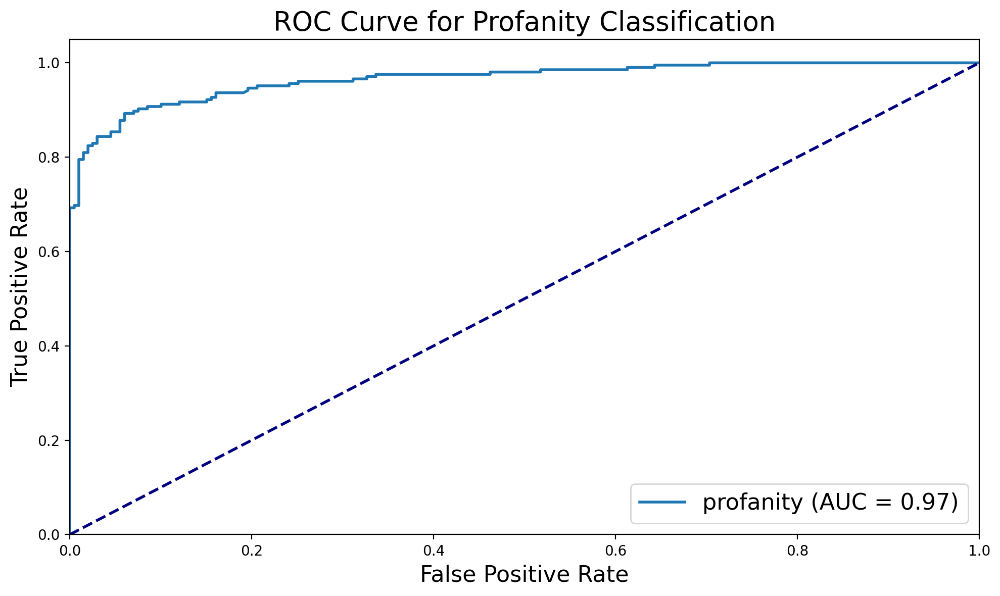

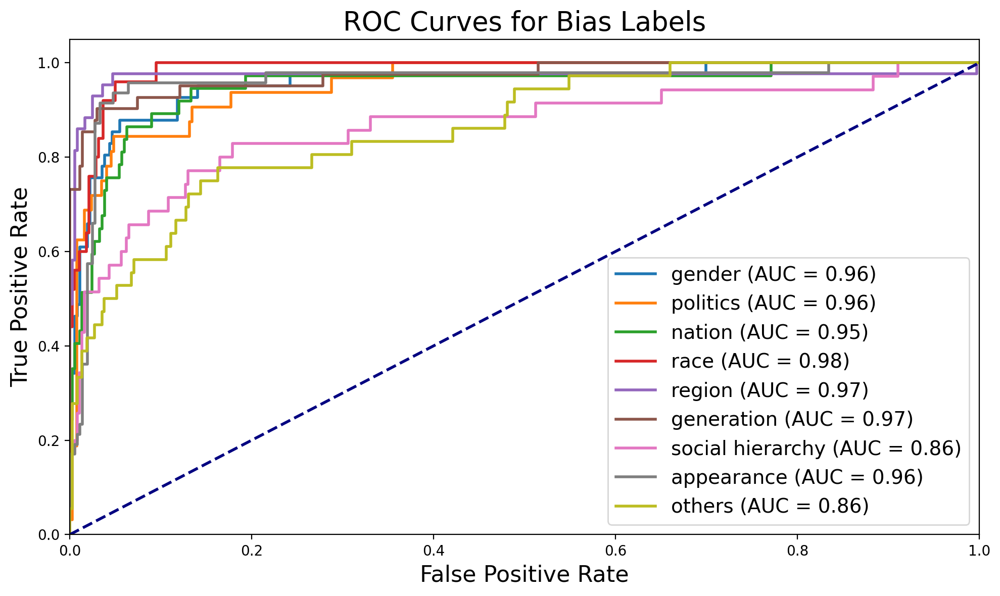

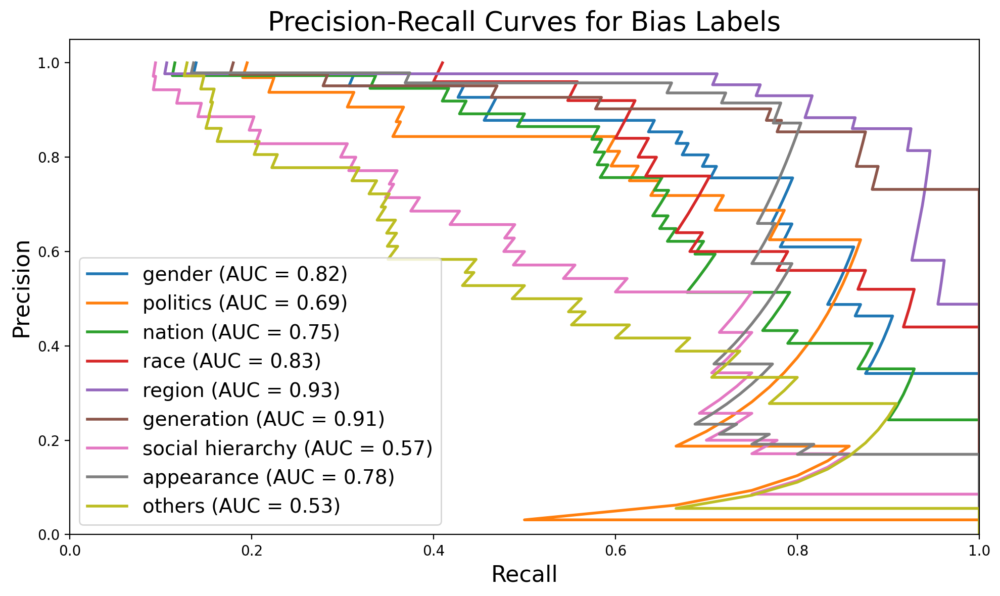


Eval results for Preference.
accuracy : 65.1
f1-macro : 64.98
preference_mae:0.42326732673267325
preference_top2_accuracy:0.905940592288971
preference_top2_f1:0.6162161989159147

Eval results for Slang.
accuracy : 90.1
precision : 89.47
recall : 91.22
f1 : 90.34
matthews_corrcoef : 80.2
pr_auc : 0.9728421325725214
roc_auc : 0.9655717612452506

Eval results for Gender.
accuracy : 94.31
precision : 67.31
recall : 85.37
f1 : 75.27
matthews_corrcoef : 72.75
pr_auc : 0.8163505145495286
roc_auc : 0.9571322985957132

Eval results for Politic.
accuracy : 95.54
precision : 71.88
recall : 71.88
f1 : 71.88
matthews_corrcoef : 69.46
pr_auc : 0.6901812613291529
roc_auc : 0.955057123655914

Eval results for Nation.
accuracy : 93.81
precision : 64.29
recall : 72.97
f1 : 68.35
matthews_corrcoef : 65.1
pr_auc : 0.7485711367235828
roc_auc : 0.9485970984608587

Eval results for Race.
accuracy : 95.3
precision : 57.5
recall : 92.0
f1 : 70.77
matthews_corrcoef : 70.6
pr_auc : 0.8278412586540767
roc_auc : 

epoch: 15, train loss: 3.9342: 100%|█████████████████████████████████████| 3836/3836 [21:51<00:00,  2.93it/s]


Preference Accuracy per class
Class 1: 73.84%
Class 2: 57.28%
Class 3: 72.52%
Class 4: 67.57%
Class 5: 60.18%


epoch: 15, valid loss: 11.1261: 100%|██████████████████████████████████████| 101/101 [00:06<00:00, 15.38it/s]


Preference Accuracy per class
Class 1: 86.59%
Class 2: 62.82%
Class 3: 52.48%
Class 4: 65.22%
Class 5: 60.81%


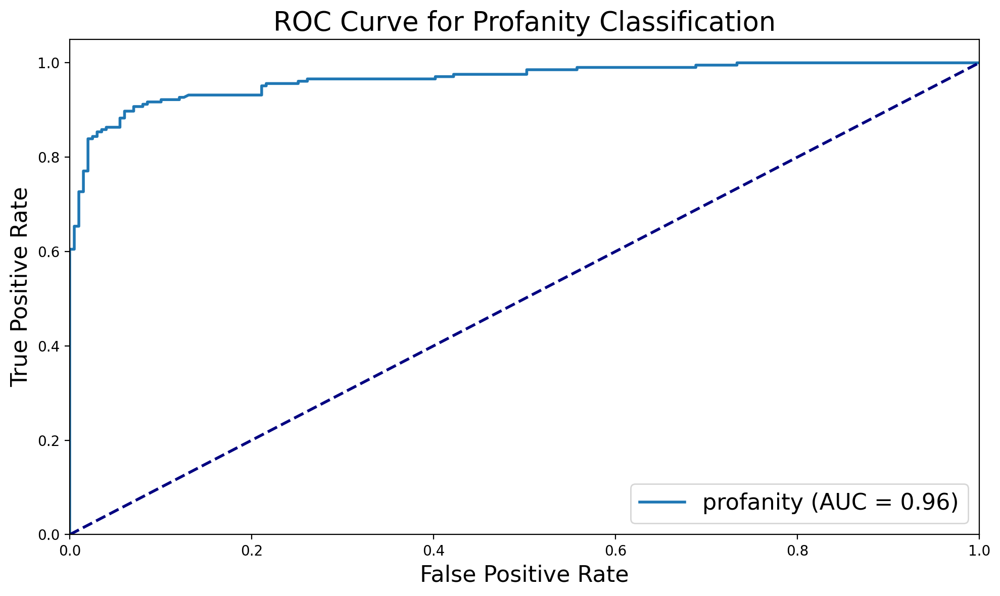

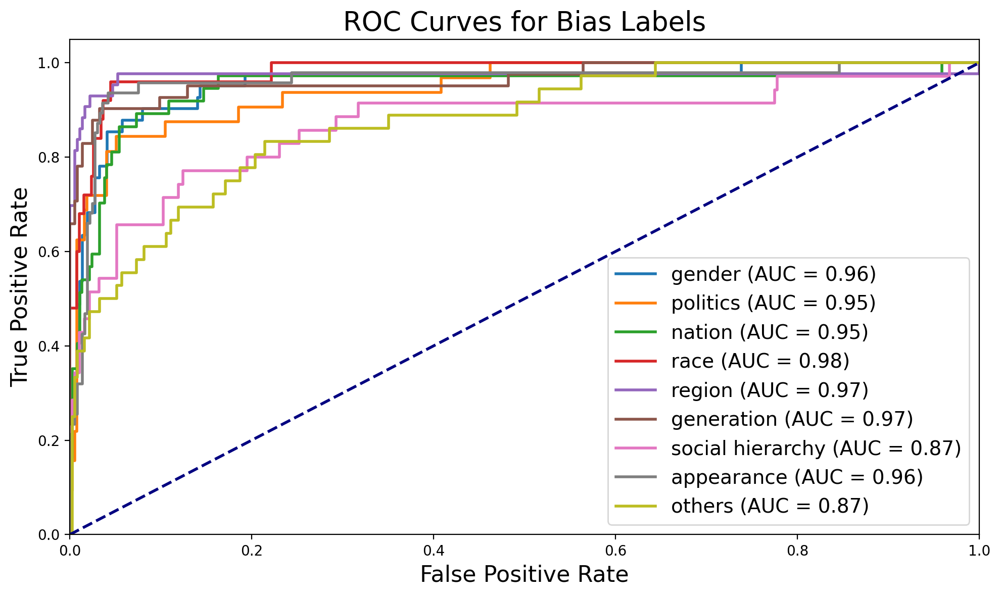

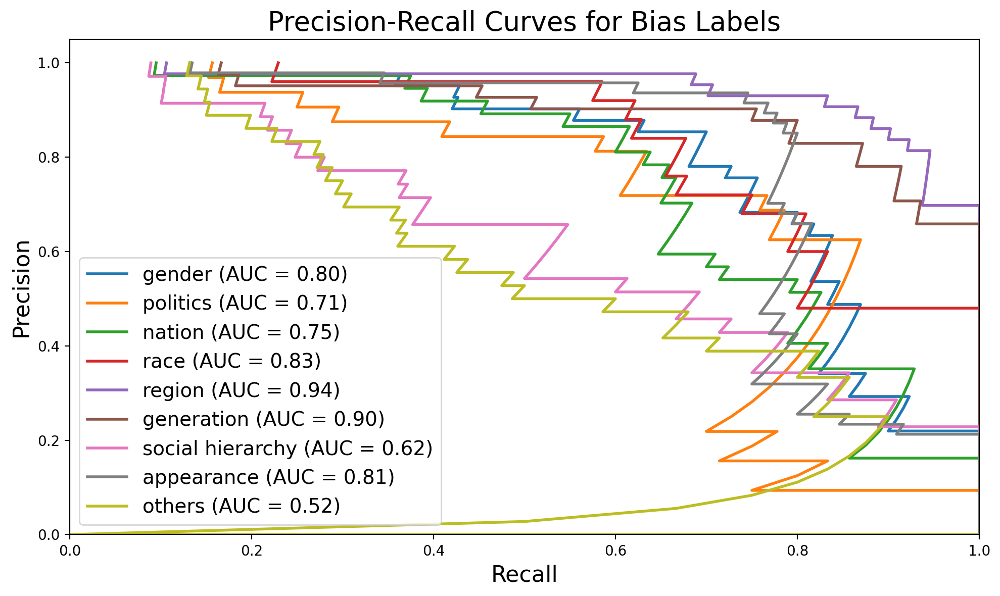


Eval results for Preference.
accuracy : 65.1
f1-macro : 65.29
preference_mae:0.40594059405940597
preference_top2_accuracy:0.9009901285171509
preference_top2_f1:0.6157869650522282

Eval results for Slang.
accuracy : 91.09
precision : 90.82
recall : 91.71
f1 : 91.26
matthews_corrcoef : 82.18
pr_auc : 0.9719987937194969
roc_auc : 0.9647873513911018

Eval results for Gender.
accuracy : 93.32
precision : 62.5
recall : 85.37
f1 : 72.16
matthews_corrcoef : 69.55
pr_auc : 0.7982106165994387
roc_auc : 0.9567291540684001

Eval results for Politic.
accuracy : 95.54
precision : 71.88
recall : 71.88
f1 : 71.88
matthews_corrcoef : 69.46
pr_auc : 0.7071310783254284
roc_auc : 0.9456485215053763

Eval results for Nation.
accuracy : 94.06
precision : 63.83
recall : 81.08
f1 : 71.43
matthews_corrcoef : 68.77
pr_auc : 0.7500494474870425
roc_auc : 0.9460932321967745

Eval results for Race.
accuracy : 95.54
precision : 58.97
recall : 92.0
f1 : 71.88
matthews_corrcoef : 71.61
pr_auc : 0.8339116075351305
roc

epoch: 16, train loss: 3.8995: 100%|█████████████████████████████████████| 3836/3836 [21:50<00:00,  2.93it/s]


Preference Accuracy per class
Class 1: 74.69%
Class 2: 57.73%
Class 3: 72.78%
Class 4: 69.99%
Class 5: 61.82%


epoch: 16, valid loss: 13.6554: 100%|██████████████████████████████████████| 101/101 [00:06<00:00, 15.35it/s]


Preference Accuracy per class
Class 1: 82.93%
Class 2: 66.67%
Class 3: 58.42%
Class 4: 52.17%
Class 5: 63.51%


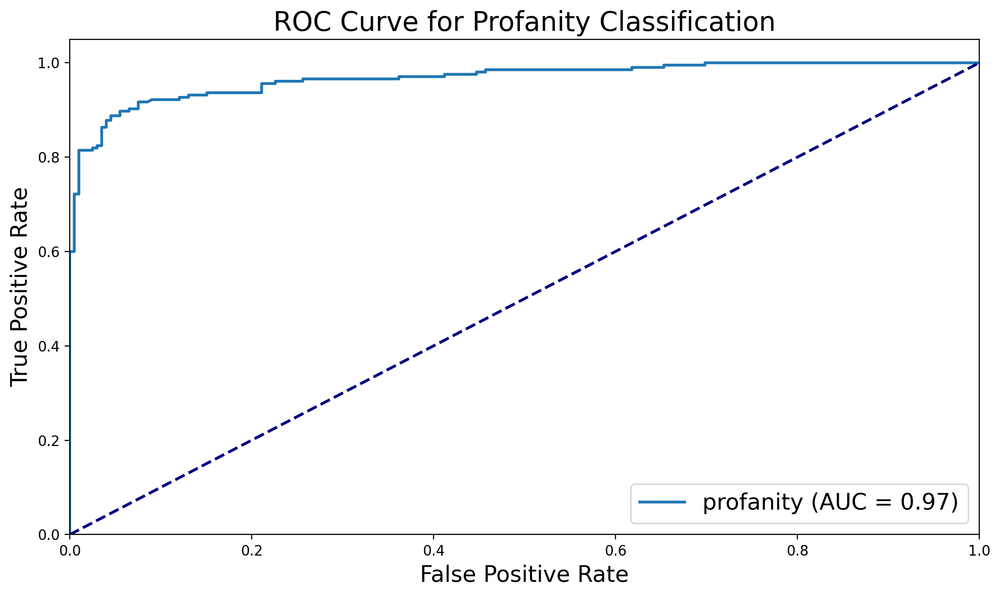

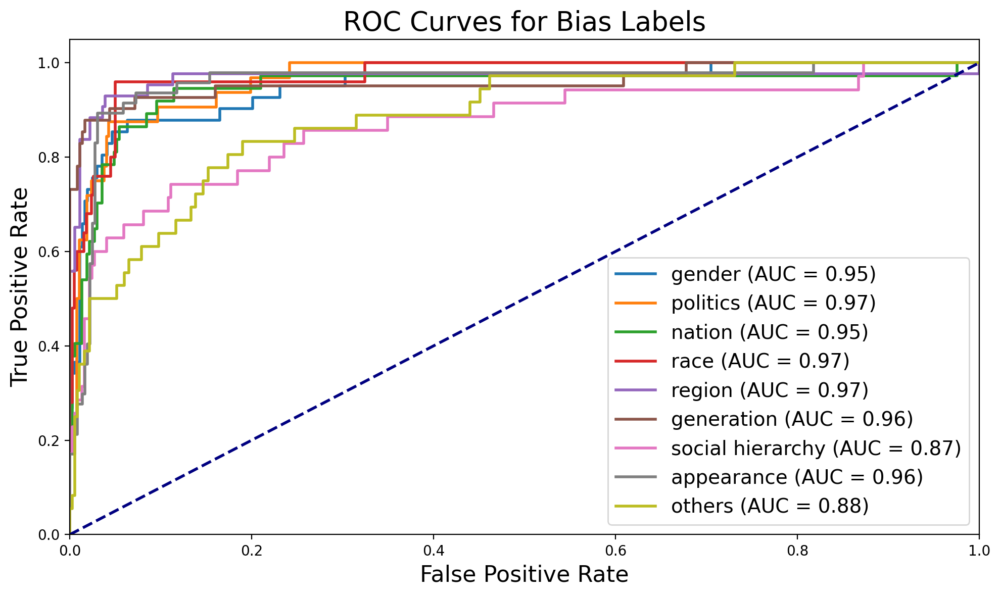

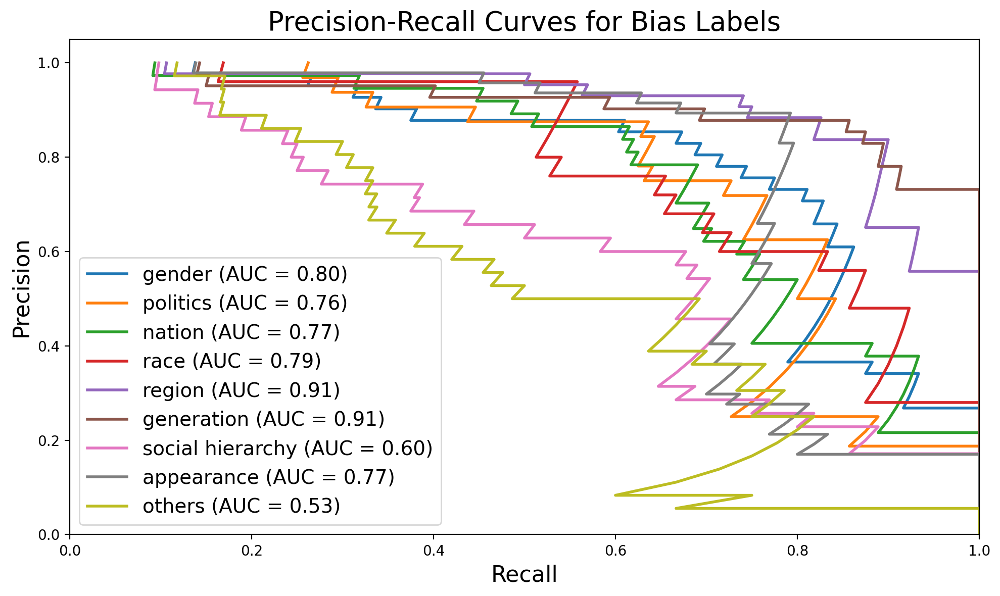


Eval results for Preference.
accuracy : 64.85
f1-macro : 64.99
preference_mae:0.41336633663366334
preference_top2_accuracy:0.8985148668289185
preference_top2_f1:0.6166145551610482

Eval results for Slang.
accuracy : 92.08
precision : 92.61
recall : 91.71
f1 : 92.16
matthews_corrcoef : 84.16
pr_auc : 0.9740126271132328
roc_auc : 0.9671650937614904

Eval results for Gender.
accuracy : 94.55
precision : 69.39
recall : 82.93
f1 : 75.56
matthews_corrcoef : 72.88
pr_auc : 0.7981276525173572
roc_auc : 0.9499428878586307

Eval results for Politic.
accuracy : 95.79
precision : 72.73
recall : 75.0
f1 : 73.85
matthews_corrcoef : 71.57
pr_auc : 0.7569322393516194
roc_auc : 0.9670698924731183

Eval results for Nation.
accuracy : 94.55
precision : 68.29
recall : 75.68
f1 : 71.79
matthews_corrcoef : 68.9
pr_auc : 0.7655017441813681
roc_auc : 0.9465350909492599

Eval results for Race.
accuracy : 94.55
precision : 54.29
recall : 76.0
f1 : 63.33
matthews_corrcoef : 61.48
pr_auc : 0.7860733306384261
roc

epoch: 17, train loss: 3.7532: 100%|█████████████████████████████████████| 3836/3836 [21:46<00:00,  2.94it/s]


Preference Accuracy per class
Class 1: 74.45%
Class 2: 58.78%
Class 3: 72.82%
Class 4: 71.72%
Class 5: 64.91%


epoch: 17, valid loss: 11.9877: 100%|██████████████████████████████████████| 101/101 [00:06<00:00, 14.58it/s]


Preference Accuracy per class
Class 1: 84.15%
Class 2: 64.10%
Class 3: 54.46%
Class 4: 65.22%
Class 5: 67.57%


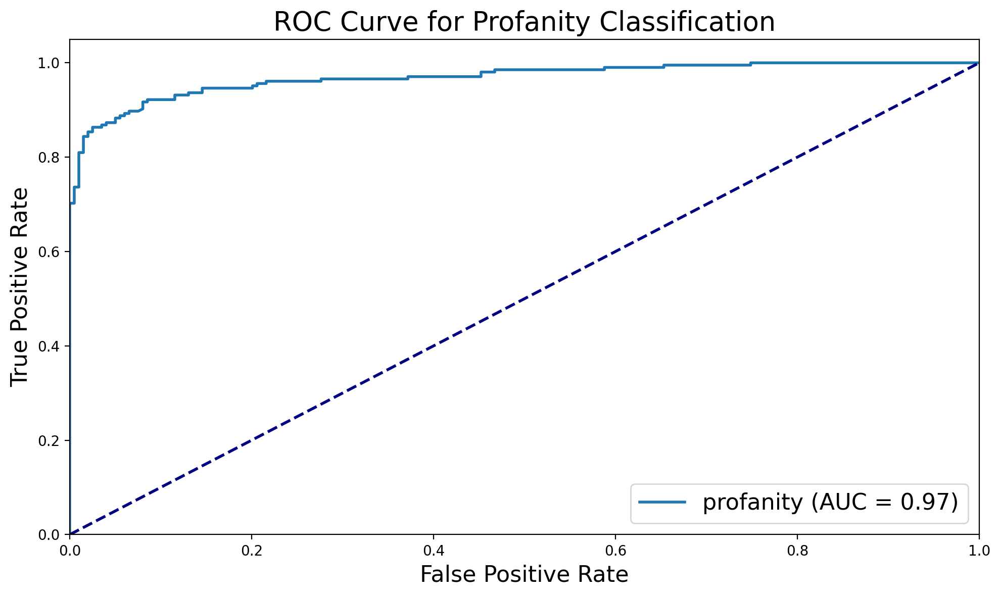

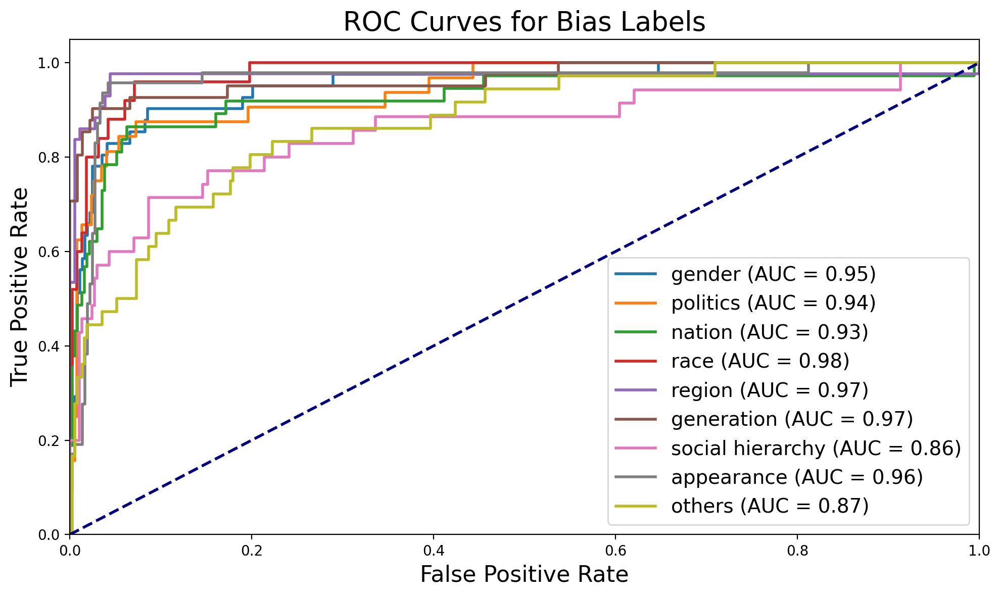

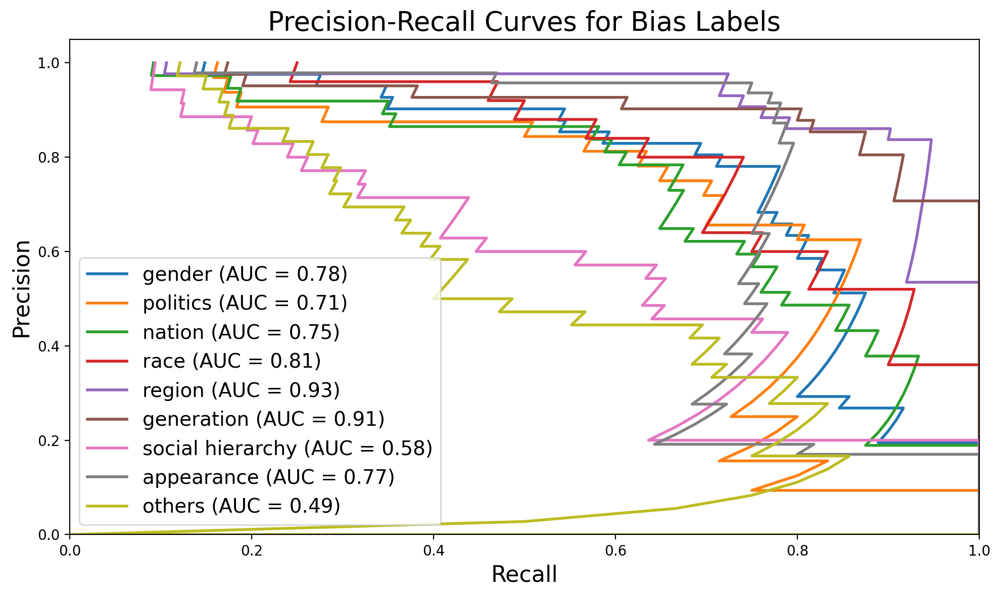


Eval results for Preference.
accuracy : 66.58
f1-macro : 66.9
preference_mae:0.39851485148514854
preference_top2_accuracy:0.9084158539772034
preference_top2_f1:0.6189715987529796

Eval results for Slang.
accuracy : 91.58
precision : 91.3
recall : 92.2
f1 : 91.75
matthews_corrcoef : 83.17
pr_auc : 0.9758627864317736
roc_auc : 0.9686358622380193

Eval results for Gender.
accuracy : 94.06
precision : 66.67
recall : 82.93
f1 : 73.91
matthews_corrcoef : 71.14
pr_auc : 0.7833849957177333
roc_auc : 0.952764899549822

Eval results for Politic.
accuracy : 95.54
precision : 70.59
recall : 75.0
f1 : 72.73
matthews_corrcoef : 70.34
pr_auc : 0.7107113447536668
roc_auc : 0.9440524193548386

Eval results for Nation.
accuracy : 94.06
precision : 65.85
recall : 72.97
f1 : 69.23
matthews_corrcoef : 66.06
pr_auc : 0.7455418343442702
roc_auc : 0.9267250902128287

Eval results for Race.
accuracy : 95.3
precision : 58.33
recall : 84.0
f1 : 68.85
matthews_corrcoef : 67.69
pr_auc : 0.8141083065365271
roc_auc

epoch: 18, train loss: 3.6151: 100%|█████████████████████████████████████| 3836/3836 [21:47<00:00,  2.93it/s]


Preference Accuracy per class
Class 1: 74.74%
Class 2: 59.83%
Class 3: 73.38%
Class 4: 70.33%
Class 5: 69.09%


epoch: 18, valid loss: 12.8389: 100%|██████████████████████████████████████| 101/101 [00:06<00:00, 14.97it/s]


Preference Accuracy per class
Class 1: 86.59%
Class 2: 64.10%
Class 3: 56.44%
Class 4: 62.32%
Class 5: 62.16%


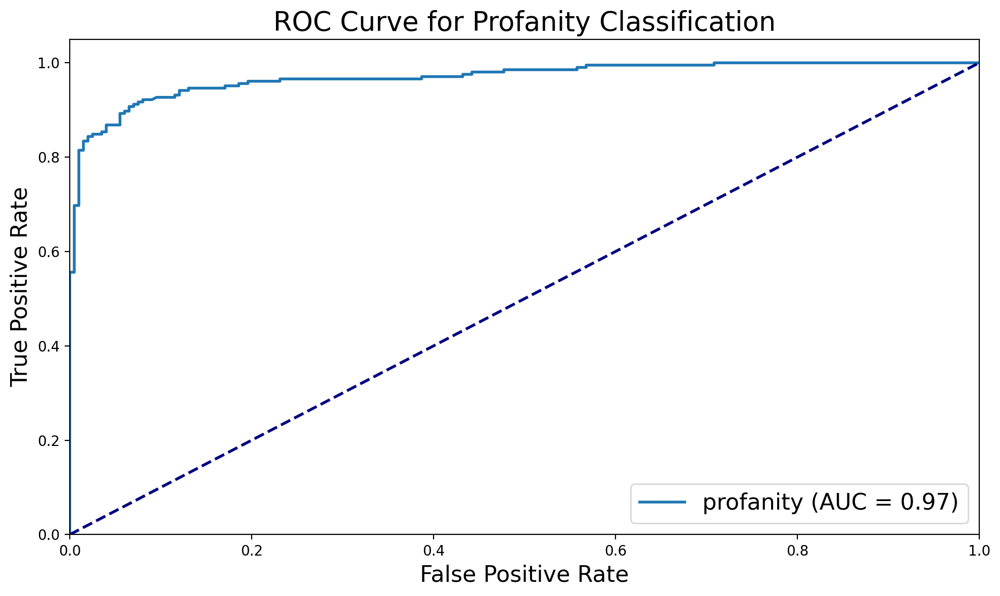

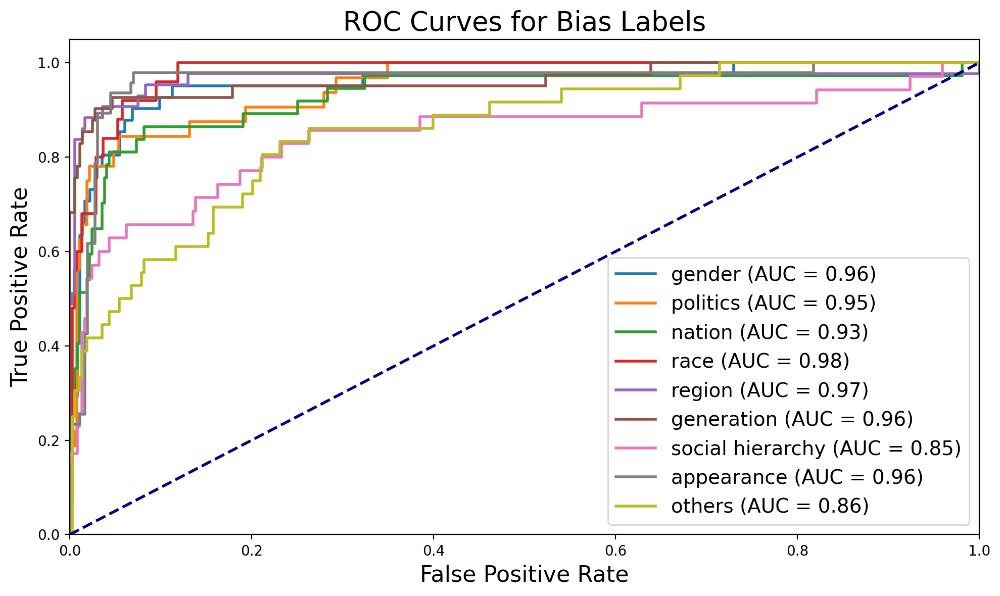

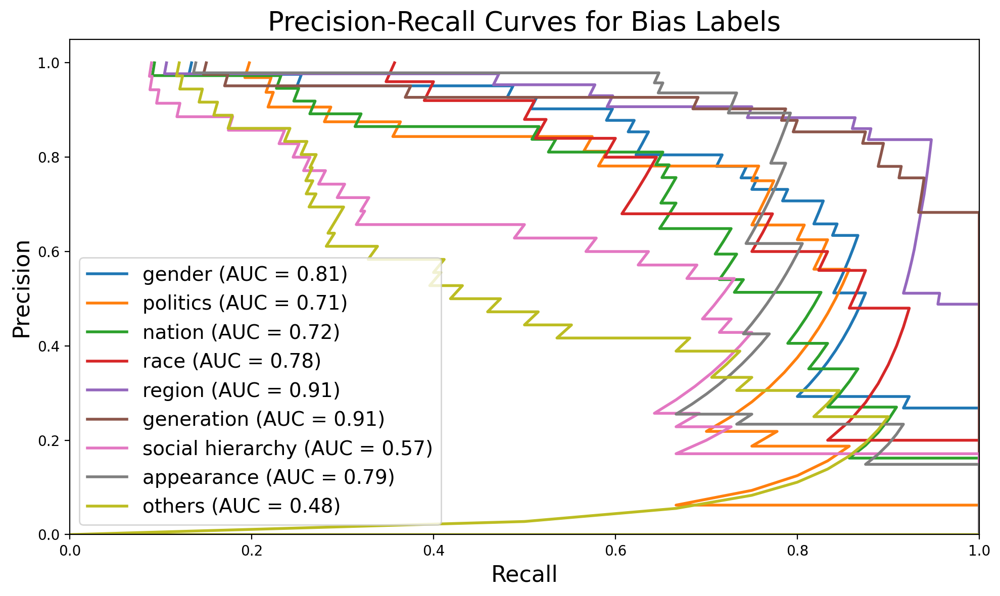


Eval results for Preference.
accuracy : 66.09
f1-macro : 66.06
preference_mae:0.4084158415841584
preference_top2_accuracy:0.896039605140686
preference_top2_f1:0.6117427346642683

Eval results for Slang.
accuracy : 91.83
precision : 93.0
recall : 90.73
f1 : 91.85
matthews_corrcoef : 83.69
pr_auc : 0.975266749035476
roc_auc : 0.9692731952445153

Eval results for Gender.
accuracy : 93.32
precision : 62.5
recall : 85.37
f1 : 72.16
matthews_corrcoef : 69.55
pr_auc : 0.8076170118197247
roc_auc : 0.9561244372774306

Eval results for Politic.
accuracy : 96.29
precision : 77.42
recall : 75.0
f1 : 76.19
matthews_corrcoef : 74.19
pr_auc : 0.7066214221119461
roc_auc : 0.9510248655913979

Eval results for Nation.
accuracy : 94.31
precision : 70.59
recall : 64.86
f1 : 67.61
matthews_corrcoef : 64.56
pr_auc : 0.7226072212731561
roc_auc : 0.9293025996023272

Eval results for Race.
accuracy : 95.54
precision : 60.61
recall : 80.0
f1 : 68.97
matthews_corrcoef : 67.36
pr_auc : 0.7821873052028064
roc_auc

epoch: 19, train loss: 3.4494: 100%|█████████████████████████████████████| 3836/3836 [21:46<00:00,  2.94it/s]


Preference Accuracy per class
Class 1: 75.77%
Class 2: 60.31%
Class 3: 74.09%
Class 4: 72.00%
Class 5: 69.82%


epoch: 19, valid loss: 12.4874: 100%|██████████████████████████████████████| 101/101 [00:06<00:00, 15.40it/s]


Preference Accuracy per class
Class 1: 86.59%
Class 2: 64.10%
Class 3: 56.44%
Class 4: 68.12%
Class 5: 64.86%


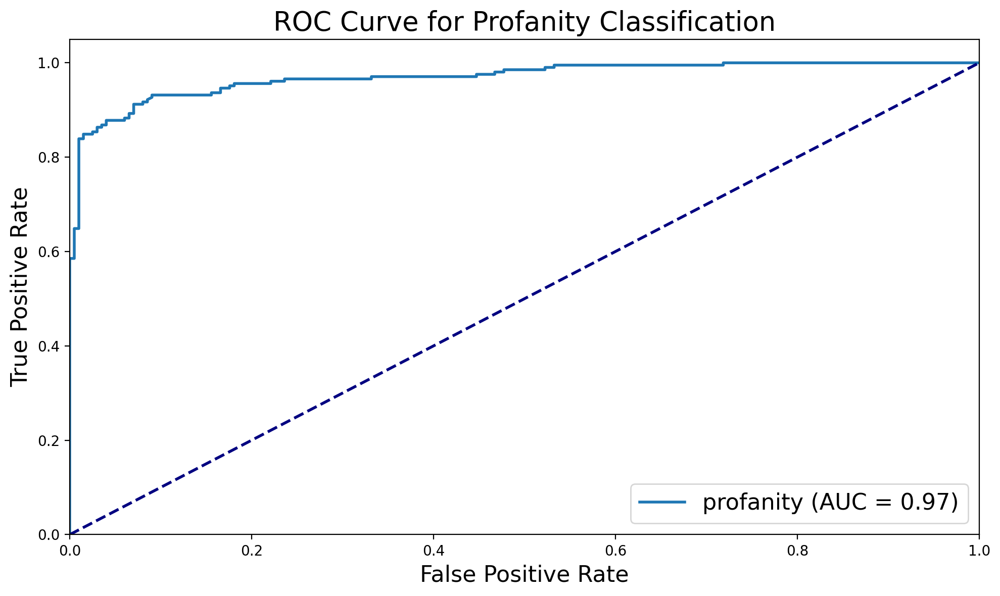

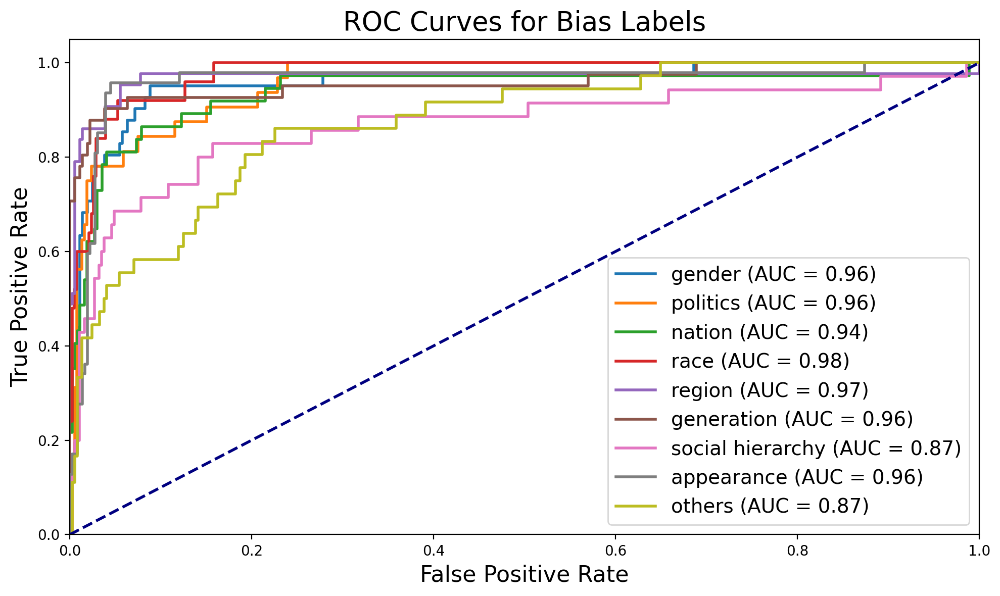

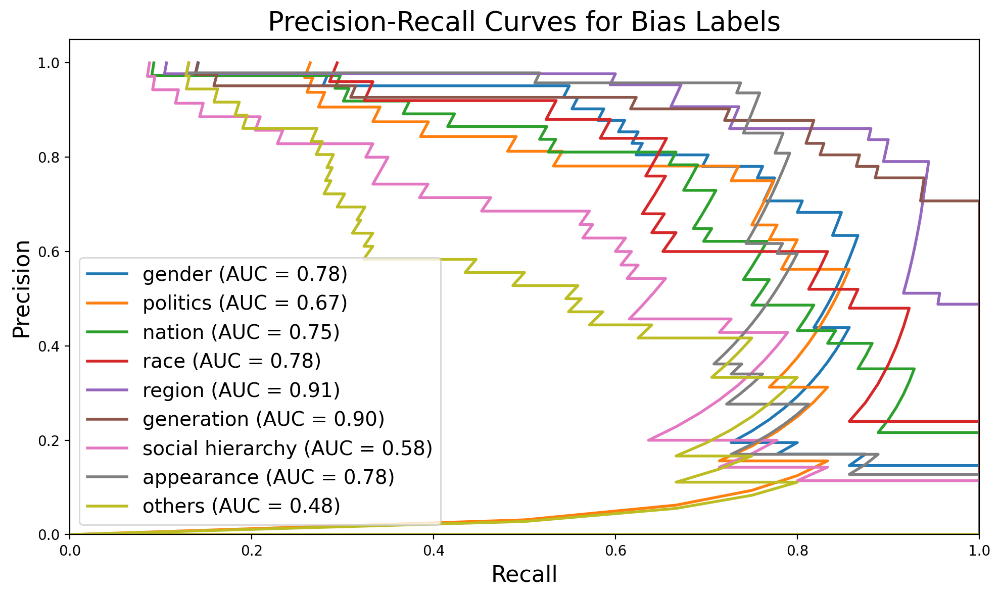


Eval results for Preference.
accuracy : 67.57
f1-macro : 67.56
preference_mae:0.38613861386138615
preference_top2_accuracy:0.9133663177490234
preference_top2_f1:0.6231794948105887

Eval results for Slang.
accuracy : 91.09
precision : 89.67
recall : 93.17
f1 : 91.39
matthews_corrcoef : 82.23
pr_auc : 0.9752513382158734
roc_auc : 0.9692486824365731

Eval results for Gender.
accuracy : 93.07
precision : 61.4
recall : 85.37
f1 : 71.43
matthews_corrcoef : 68.79
pr_auc : 0.778539241895648
roc_auc : 0.9579385876503393

Eval results for Politic.
accuracy : 96.04
precision : 76.67
recall : 71.88
f1 : 74.19
matthews_corrcoef : 72.1
pr_auc : 0.6731665163620516
roc_auc : 0.9592573924731183

Eval results for Nation.
accuracy : 94.06
precision : 68.57
recall : 64.86
f1 : 66.67
matthews_corrcoef : 63.44
pr_auc : 0.7540810274610281
roc_auc : 0.9394653509094928

Eval results for Race.
accuracy : 96.04
precision : 63.64
recall : 84.0
f1 : 72.41
matthews_corrcoef : 71.11
pr_auc : 0.7802610693520551
roc_

epoch: 20, train loss: 3.2807: 100%|█████████████████████████████████████| 3836/3836 [21:47<00:00,  2.93it/s]


Preference Accuracy per class
Class 1: 75.62%
Class 2: 61.33%
Class 3: 73.67%
Class 4: 75.17%
Class 5: 72.00%


epoch: 20, valid loss: 12.2073: 100%|██████████████████████████████████████| 101/101 [00:06<00:00, 15.34it/s]


Preference Accuracy per class
Class 1: 86.59%
Class 2: 61.54%
Class 3: 53.47%
Class 4: 68.12%
Class 5: 59.46%


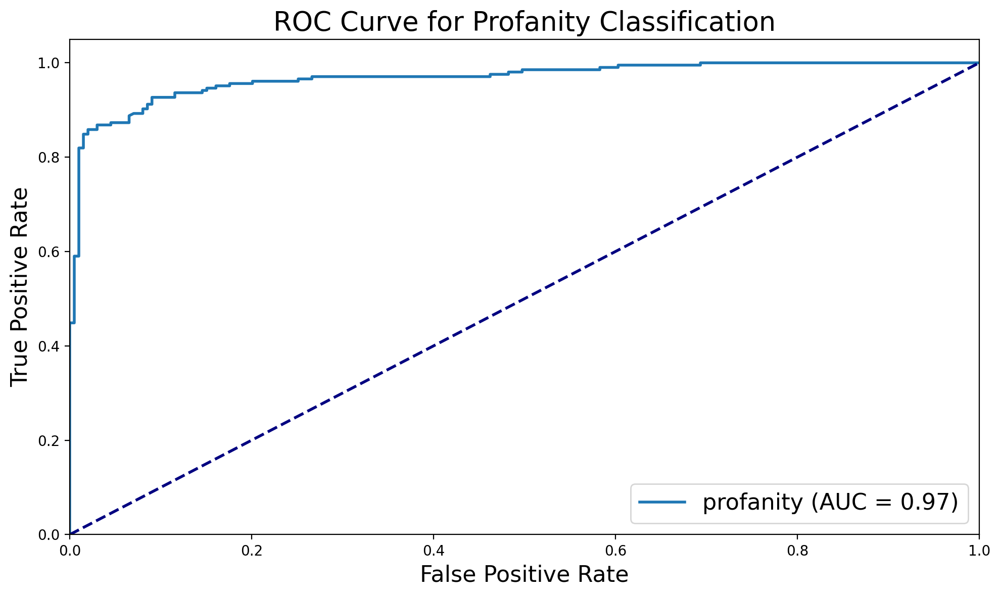

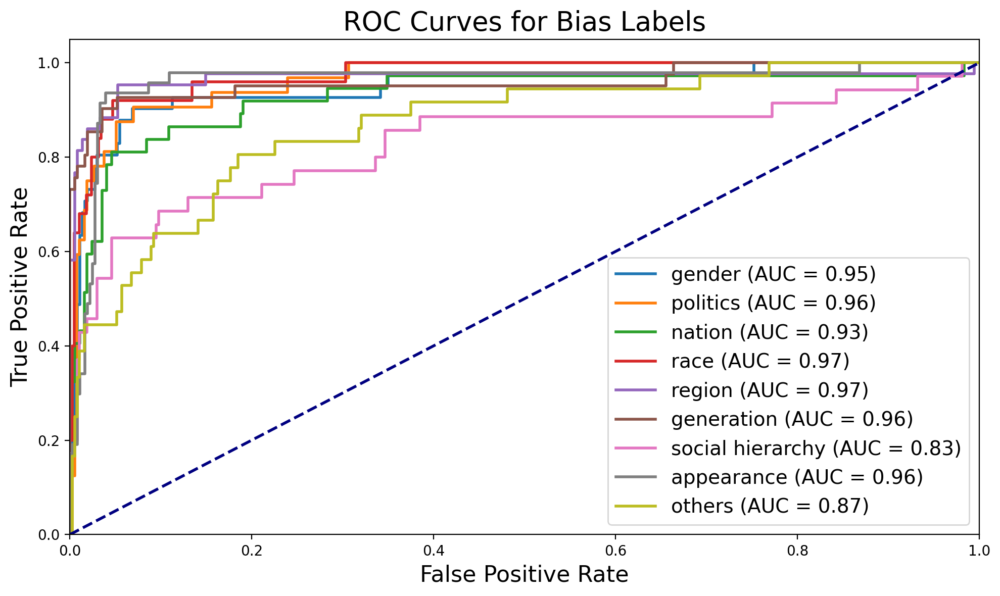

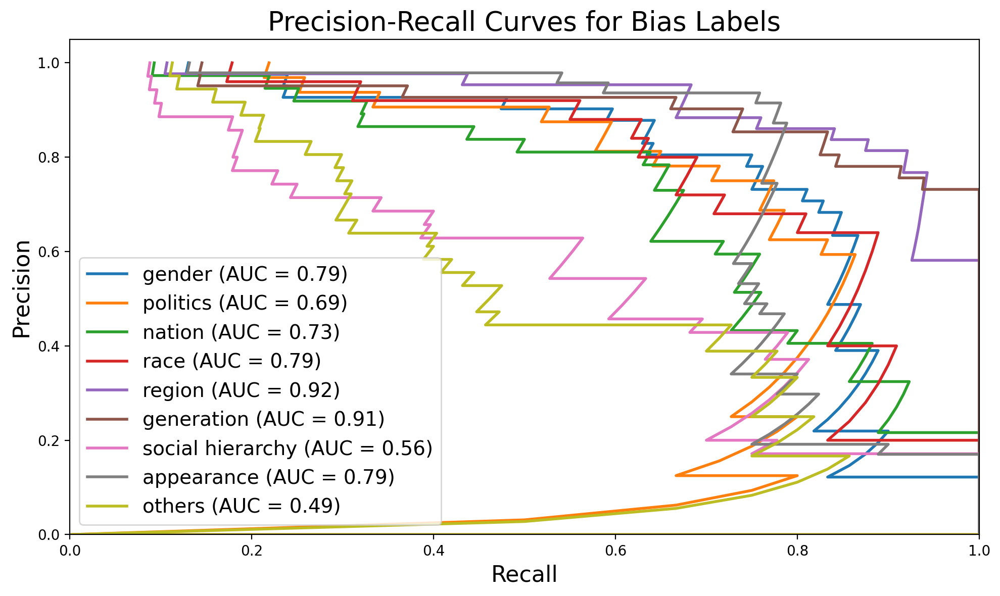


Eval results for Preference.
accuracy : 65.35
f1-macro : 65.48
preference_mae:0.4158415841584158
preference_top2_accuracy:0.9084158539772034
preference_top2_f1:0.6201697042225341

Eval results for Slang.
accuracy : 91.58
precision : 91.3
recall : 92.2
f1 : 91.75
matthews_corrcoef : 83.17
pr_auc : 0.9731617227873725
roc_auc : 0.9676798627282753

Eval results for Gender.
accuracy : 94.06
precision : 67.35
recall : 80.49
f1 : 73.33
matthews_corrcoef : 70.37
pr_auc : 0.7854047349973206
roc_auc : 0.9491365988040045

Eval results for Politic.
accuracy : 96.04
precision : 76.67
recall : 71.88
f1 : 74.19
matthews_corrcoef : 72.1
pr_auc : 0.687191947299342
roc_auc : 0.9643817204301075

Eval results for Nation.
accuracy : 93.81
precision : 65.79
recall : 67.57
f1 : 66.67
matthews_corrcoef : 63.26
pr_auc : 0.7277098359577896
roc_auc : 0.9290080271006701

Eval results for Race.
accuracy : 96.04
precision : 63.64
recall : 84.0
f1 : 72.41
matthews_corrcoef : 71.11
pr_auc : 0.7902653252294127
roc_au

In [22]:
train_losses = []
val_f1 = []
val_roc_auc= []
val_accuracy = []
val_mae = []
val_top2_acc = []
val_top2_f1 = []
val_pr_auc = []
best_avg_score = 0

if config.do_train:
    best_score = [0] * 11
    # Start training over a number of epochs
    for epoch in range(config.num_train_epochs):
        train_results = run_epoch(loader=train_dataloader, epoch=epoch, is_train=True, **params)
        train_loss = train_results['loss']
        train_losses.append(train_loss)
        
        # Optionally evaluate model during training
        if config.do_eval_during_train:
            eval_results = do_eval(epoch)
            
            # Store evaluation metrics
            val_f1.append(tuple(eval_results[i]["f1-macro"] if i == 0 else eval_results[i]["f1"] for i in range(11)))
            val_roc_auc.append(tuple(eval_results[i]["roc_auc"] for i in range(1, 11)))
            val_accuracy.append(tuple(eval_results[i]["accuracy"] for i in range(11)))
            val_mae.append(eval_results[11])
            val_top2_acc.append(eval_results[12])
            val_top2_f1.append(eval_results[13])
            val_pr_auc.append(tuple(eval_results[-10:]))
            
            # Check and store best model based on average F1 score
            current_score = [eval_results[i]["f1-macro"] if i == 0 else eval_results[i]["f1"] for i in range(11)]
            current_avg_score = sum(current_score) / len(current_score)  
            if current_avg_score >= best_avg_score:
                best_avg_score = current_avg_score
                output_dir = os.path.join(config.output_dir, config.task, config.dataset, f"{epoch}-best-ckpt")
                # Save best model
                copy.deepcopy(
                    model_dp.module if hasattr(model_dp, "module") else model_dp._models[0] if hasattr(model_dp, "_models") else model_dp
                ).cpu().save_pretrained(output_dir)
                # Save configuration of best model
                with open(os.path.join(output_dir, "finetune_config.json"), "w") as save_config:
                    json.dump(vars(config), save_config, sort_keys=True, indent=4)
                print(f"Checkpoint {output_dir} saved.")             

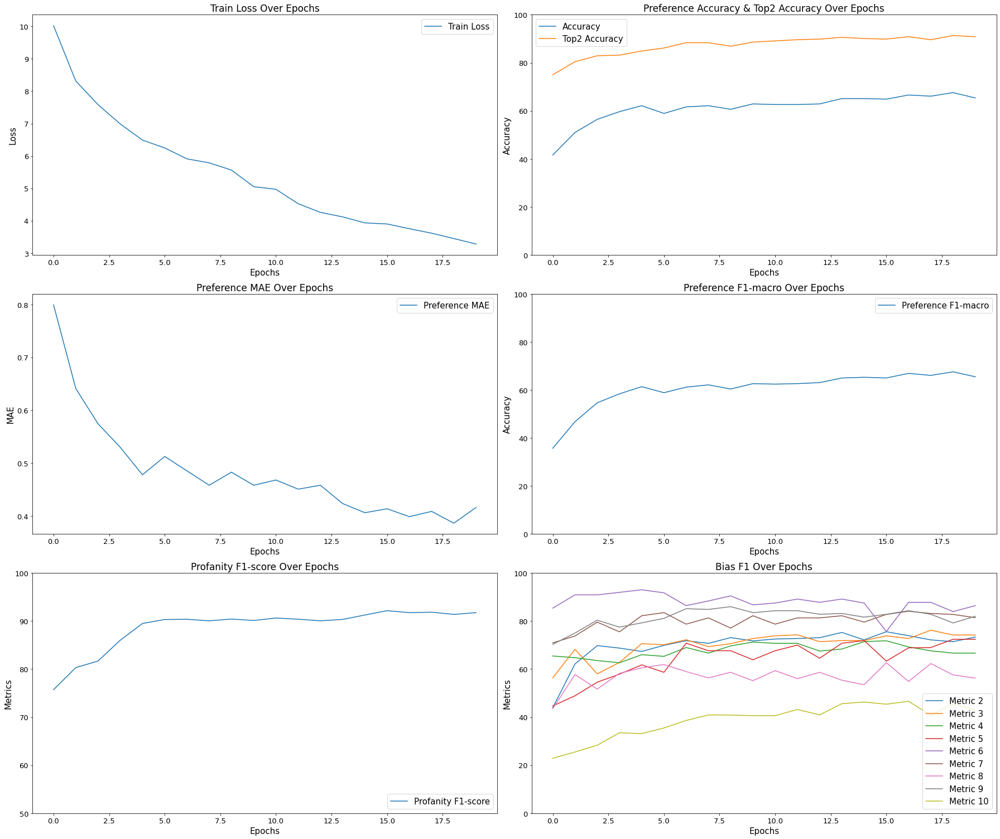

In [24]:
import numpy as npii
import matplotlib.pyplot as plt

# Create a 3x2 grid for the subplots
fig, axs = plt.subplots(nrows=3, ncols=2, figsize=(25, 21))

# 1. Train Loss Over Epochs
axs[0, 0].plot(train_losses, label='Train Loss')
axs[0, 0].set_xlabel('Epochs', fontsize=15)
axs[0, 0].set_ylabel('Loss', fontsize=15)
axs[0, 0].set_title('Train Loss Over Epochs', fontsize=17)
axs[0, 0].legend(fontsize=15)
axs[0, 0].tick_params(axis='both', labelsize=13)
axs[0, 0].grid(False)

# 2. Preference Accuracy & Top2 Accuracy Over Epochs
val_accuracy = np.array(val_accuracy)
val_top2_accuracy = np.array(val_top2_acc) * 100
axs[0, 1].plot(val_accuracy[:, 0], label='Accuracy', linestyle='-')
axs[0, 1].plot(val_top2_accuracy, label='Top2 Accuracy', linestyle='-')
axs[0, 1].set_xlabel('Epochs', fontsize=15)
axs[0, 1].set_ylabel('Accuracy', fontsize=15)
axs[0, 1].set_ylim(0, 100)
axs[0, 1].set_title('Preference Accuracy & Top2 Accuracy Over Epochs', fontsize=17)
axs[0, 1].legend(fontsize=15)
axs[0, 1].tick_params(axis='both', labelsize=13)
axs[0, 1].grid(False)

# 3. Preference MAE Over Epochs
val_mae = np.array(val_mae)
axs[1, 0].plot(val_mae, label='Preference MAE', linestyle='-')
axs[1, 0].set_xlabel('Epochs', fontsize=15)
axs[1, 0].set_ylabel('MAE', fontsize=15)
axs[1, 0].set_title('Preference MAE Over Epochs', fontsize=17)
axs[1, 0].legend(fontsize=15)
axs[1, 0].tick_params(axis='both', labelsize=13)
axs[1, 0].grid(False)

# 4. Preference F1-macro Over Epochs
result = [val_f1[i][0] for i in range(config.num_train_epochs)]
axs[1, 1].plot(result, label='Preference F1-macro', linestyle='-')
axs[1, 1].set_xlabel('Epochs', fontsize=15)
axs[1, 1].set_ylabel('F1-macro', fontsize=15)
axs[1, 1].set_ylim(0, 100)
axs[1, 1].set_title('Preference F1-macro Over Epochs', fontsize=17)
axs[1, 1].legend(fontsize=15)
axs[1, 1].tick_params(axis='both', labelsize=13)
axs[1, 1].grid(False)

# 5. Profanity Metrics Over Epochs
result = [val_f1[i][1] for i in range(config.num_train_epochs)]
axs[2, 0].plot(result, label='Profanity F1-score', linestyle='-')
axs[2, 0].set_xlabel('Epochs', fontsize=15)
axs[2, 0].set_ylabel('F1-score', fontsize=15)
axs[2, 0].set_ylim(50, 100)
axs[2, 0].set_title('Profanity F1-score Over Epochs', fontsize=17)
axs[2, 0].legend(loc="lower right", fontsize=15)
axs[2, 0].tick_params(axis='both', labelsize=13)
axs[2, 0].grid(False)

# 6. Bias F1-score Over Epochs
for j in range(2, 11):
    result = [val_f1[i][j] for i in range(config.num_train_epochs)]
    axs[2, 1].plot(result, label=f'Metric {j}', linestyle='-')
    axs[2, 1].set_xlabel('Epochs', fontsize=15)
    axs[2, 1].set_ylabel('F1-score', fontsize=15)
    axs[2, 1].set_ylim(0, 100)
    axs[2, 1].set_title('Bias F1 Over Epochs', fontsize=17)
    axs[2, 1].legend(loc="lower right", fontsize=15)
    axs[2, 1].tick_params(axis='both', labelsize=13)
    axs[2, 1].grid(False)

plt.tight_layout()
#plt.savefig('combined_plots.pdf', format='pdf')
plt.show()